In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import sys
sys.path = ['/data/mhoffert/tools/ete/'] + sys.path[:-1]
from ete3 import Tree
from ete3.treeview import faces, AttrFace, TextFace, TreeStyle, NodeStyle, CircleFace, RectFace

# python libraries
import pickle
import itertools
import random
import os


# data
import pandas as pd
import numpy as np

# scipy
import scipy.stats
from scipy.spatial import ConvexHull, Delaunay
from scipy.spatial.distance import cdist, pdist, squareform
from scipy.cluster.hierarchy import dendrogram, linkage

# sklearn
from sklearn import manifold
from sklearn import svm
from sklearn.datasets import make_blobs
from sklearn.utils import check_random_state
from sklearn.preprocessing import scale, StandardScaler
from sklearn.metrics.pairwise import pairwise_distances
from sklearn.metrics import f1_score

# clustering
from sklearn.cluster import DBSCAN
import hdbscan

# statistics
import mantel

# plotting
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from matplotlib.collections import PolyCollection
import matplotlib
import matplotlib.cm as cm
import matplotlib.patches as patches
from matplotlib.colors import to_hex

# additional plotting code
import sys
import time
sys.path.append('/data/mhoffert/fiererlab/periodic_phyla/code/')

from tufte_box import *

# displays
from IPython.display import display, clear_output

# ENS-t-SNE
sys.path.append('/data/mhoffert/tools/MPSE-TSNE/ENS-t-SNE/')
import mview

# for visualizing trees
os.environ['QT_QPA_PLATFORM']='offscreen'

## Outline
Finalized code to make the periodic table figure.

In [3]:
import ete3 as ete3
ete3.__version__

'3.1.2'

## Load GTDB data

In [4]:
# read in gtdb metadata
md = pd.read_csv('/data/mhoffert/genomes/GTDB_r207/bac120_metadata_r207.tsv', sep='\t')

# filter to representatives
md = md[md.gtdb_representative.eq('t')].copy(deep=True)
md['Phylum'] = md.gtdb_taxonomy.apply(lambda x: x.split(';')[1].split('__')[-1])
md['Class'] = md.gtdb_taxonomy.apply(lambda x: x.split(';')[2].split('__')[-1])
md['Order'] = md.gtdb_taxonomy.apply(lambda x: x.split(';')[3].split('__')[-1])
md['Family'] = md.gtdb_taxonomy.apply(lambda x: x.split(';')[4].split('__')[-1])
md['Genus'] = md.gtdb_taxonomy.apply(lambda x: x.split(';')[5].split('__')[-1])
md['Species'] = md.gtdb_taxonomy.apply(lambda x: x.split(';')[6].split('__')[-1])

# subset to phyla with at least 100 representatives
phylum_counts = md.groupby('Phylum').count()
top_phyla = phylum_counts[phylum_counts['accession'] > 100].index.unique()
md_top_phyla = md[md['Phylum'].isin(top_phyla)].copy(deep=True)

Columns (61,65,74,82,83,85) have mixed types. Specify dtype option on import or set low_memory=False.


In [5]:
# additional columns
phylum_counts = md_top_phyla.groupby('Phylum').count()['accession']
class_counts = md_top_phyla.groupby('Class').count()['accession']

# parsing to make plot of isolate vs. environmental
md_top_phyla['ncbi_genome_category_grouped'] = md_top_phyla['ncbi_genome_category'].apply(lambda x: 'Isolate' if x=='none' else 'MAG/SAG/environmental')

In [6]:
md_top_phyla['accession_reformat'] = md_top_phyla['accession'].apply(lambda x: x.replace('.', '_'))

In [7]:
# get a list of the most abundant phyla
most_abundant_phyla = md_top_phyla.groupby(['Phylum']).count().sort_values('accession', ascending=False).head(10)
print(most_abundant_phyla['accession'])

Phylum
Proteobacteria       17350
Bacteroidota          8588
Firmicutes_A          8243
Actinobacteriota      7328
Firmicutes            4216
Patescibacteria       2485
Chloroflexota         1387
Cyanobacteria         1372
Verrucomicrobiota     1325
Planctomycetota       1071
Name: accession, dtype: int64


In [8]:
md['ncbi_isolation_source'].value_counts()

ncbi_isolation_source
none                                      56895
soil                                        306
biological product [ENVO:02000043]          171
derived from human gut metagenome           156
not provided; submitted under MIGS 2.1      136
                                          ...  
a paper mill waste water polluted pond        1
soil sediment                                 1
grasslands                                    1
soil of a rice field                          1
host s whole body                             1
Name: count, Length: 2026, dtype: int64

## Load trait data

In [9]:
with open('/data/mhoffert/fiererlab/periodic_phyla/results/20230814_pca_data.pickle', 'rb') as handle:
    pca_data = pickle.load(handle)

In [10]:
pca_data.index = [i.replace('.', '_') for i in pca_data.index]

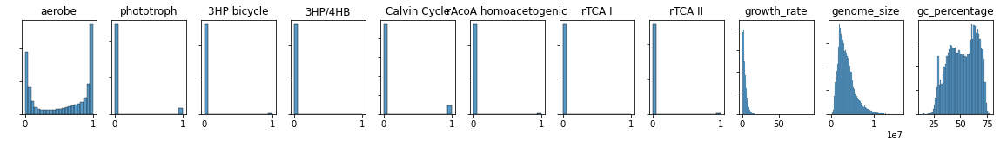

In [11]:
'''
Identify candidate data points for removal
'''
fig = plt.figure(figsize=(20,2))
i = 1
for col in pca_data.columns:
    ax = fig.add_subplot(1, len(pca_data.columns), i)
    # print(list(df_dict.keys())[i])
    sns.histplot(pca_data[col].values, ax=ax)
    ax.set_ylabel(' ')
    ax.set_xlabel(' ')
    plt.tick_params(labelleft=False)
    ax.set_title(col)
    # plt.show()
    i += 1

Looks like some things need to be filtered based on growth rate

### Remove observations with extremely high growth rate

In [12]:
# 
print(pca_data.shape)
pca_data = pca_data[pca_data['growth_rate'] < 25]
print(pca_data.shape)

(51880, 11)
(51851, 11)


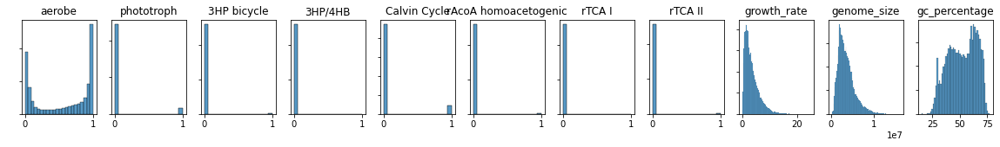

In [13]:
'''
Identify candidate data points for removal
'''
fig = plt.figure(figsize=(20,2))
i = 1
for col in pca_data.columns:
    ax = fig.add_subplot(1, len(pca_data.columns), i)
    # print(list(df_dict.keys())[i])
    sns.histplot(pca_data[col], ax=ax)
    ax.set_ylabel(' ')
    ax.set_xlabel(' ')
    plt.tick_params(labelleft=False)
    ax.set_title(col)
    # plt.show()
    i += 1

### Leaf distance matrix

In [14]:
# no longer needed
# %%time
# with open('/data/mhoffert/fiererlab/periodic_phyla/results/trees/GTDB_full_tip_dist_matrix_np.pickle', 'rb') as handle:
#     distance_matrix = pickle.load(handle)

In [15]:
with open('/data/mhoffert/fiererlab/periodic_phyla/results/trees/GTDB_full_tip_dist_matrix_rownames.txt', 'r') as handle:
    row_names_lines = handle.readlines()

row_names = [r.strip().replace('"', '') for r in row_names_lines[1:]]
row_names_series = pd.Series(row_names)

In [16]:
# list of genomes in phyla with at least 100 representatives
top_phyla_genome_accs = md_top_phyla['accession_reformat'].unique()

# vector of T/F for leaves in the trait data used to subset distance matrix
keep_rows = np.array([r in pca_data.index and r in top_phyla_genome_accs for r in row_names])

# same as above, used to reindex trait data
keep_rows_names = np.array([r for r in row_names if r in pca_data.index and r in top_phyla_genome_accs])

In [17]:
len(keep_rows_names), np.sum(keep_rows)

(50745, 50745)

In [18]:
# no longer needed
# patristic_distance_matrix = distance_matrix[keep_rows, :][:, keep_rows]

### Scale data

In [19]:
# scaling individual columns in the data
def scale_func(x, xname):
    # print(f'scaling {xname}')
    return scale(x)

# only scaling some columns
to_scale_vars = ['growth_rate', 'genome_size', 'gc_percentage']
pca_data.head().apply(lambda x: scale_func(x, x.name) if x.name in to_scale_vars else x)

,aerobe,phototroph,3HP bicycle,3HP/4HB,Calvin Cycle,rAcoA homoacetogenic,rTCA I,rTCA II,growth_rate,genome_size,gc_percentage
GB_GCA_000007325_1,0.001817,0,0.0,0.0,0.0,0.0,0.0,0.0,0.556748,-0.026066,-0.710654
GB_GCA_000008885_1,0.470498,0,0.0,0.0,0.0,0.0,0.0,0.0,0.735718,-1.115905,-1.049117
GB_GCA_000009845_1,0.682832,0,0.0,0.0,0.0,0.0,0.0,0.0,1.045784,-1.004745,-0.666624
GB_GCA_000010085_1,0.865893,0,0.0,0.0,0.0,0.0,0.0,0.0,-1.569988,1.542596,1.269066
GB_GCA_000010565_1,0.018416,0,0.0,0.0,0.0,0.0,0.0,0.0,-0.768261,0.604120,1.157329


In [20]:
# scale and take values as floats
np_pca_data = pca_data.apply(lambda x: scale_func(x, x.name) if x.name in to_scale_vars else x).reindex(keep_rows_names).astype(float)

np_pca_data.head()

,aerobe,phototroph,3HP bicycle,3HP/4HB,Calvin Cycle,rAcoA homoacetogenic,rTCA I,rTCA II,growth_rate,genome_size,gc_percentage
GB_GCA_012517545_1,0.012481,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-0.120779,-0.637998,-1.708150
GB_GCA_017540815_1,0.008260,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-0.867855,-0.264948,-0.797864
GB_GCA_001829125_1,0.046911,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.404638,0.426372,-1.989249
GB_GCA_009784515_1,0.081483,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.767524,-0.915710,-0.887366
GB_GCA_016936615_1,0.052110,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-0.436930,-0.170182,-1.136206


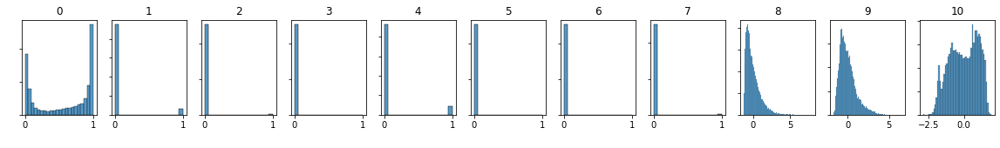

In [21]:
'''
plotting scaled data
'''
fig = plt.figure(figsize=(20,2))
i = 1
for col in range(len(pca_data.columns)):
    ax = fig.add_subplot(1, len(pca_data.columns), i)
    # print(list(df_dict.keys())[i])
    sns.histplot(np_pca_data.values[:, col], ax=ax)
    ax.set_ylabel(' ')
    ax.set_xlabel(' ')
    plt.tick_params(labelleft=False)
    ax.set_title(col)
    # plt.show()
    i += 1

In [23]:
np_pca_data.shape #, patristic_distance_matrix.shape

(50745, 11)

### Loading in the tree

In [24]:
gtdb_full = Tree('/data/mhoffert/genomes/GTDB_r207/tree/bac120_r207.tree', format=1, quoted_node_names=True)

### Reformatting tree

In [25]:
# rename internal nodes
names_map = []
i = 0
for node in gtdb_full.traverse(strategy='levelorder'):
    if i % 500 == 0:
        display(i)
        clear_output(wait=True)
    if not node.is_leaf():
        new_node_name = f'c{i:06}'
        names_map.append((new_node_name, node.name))
        node.name = new_node_name
    else:
        names_map.append((node.name.replace('.', '_'), node.name))
        node.name = node.name.replace('.', '_')
    i += 1

124500

In [26]:
# make a series
names_map = pd.Series(dict(names_map))

In [27]:
phylum_counts.sort_values(ascending=False)

Phylum
Proteobacteria        17350
Bacteroidota           8588
Firmicutes_A           8243
Actinobacteriota       7328
Firmicutes             4216
Patescibacteria        2485
Chloroflexota          1387
Cyanobacteria          1372
Verrucomicrobiota      1325
Planctomycetota        1071
Desulfobacterota        939
Acidobacteriota         873
Spirochaetota           695
Campylobacterota        550
Firmicutes_C            395
Myxococcota             393
Firmicutes_B            323
Nitrospirota            314
Omnitrophota            282
Gemmatimonadota         237
Desulfobacterota_I      236
Bdellovibrionota        224
Elusimicrobiota         189
Marinisomatota          186
Chlamydiota             171
Deinococcota            144
Armatimonadota          139
Synergistota            132
Firmicutes_G            131
Fibrobacterota          120
Firmicutes_D            104
Name: accession, dtype: int64

## Plotting phylum selection to try to find conserved clades of microbes

In [28]:
# create a version of gtdb tree with only clades of interest
gtdb_pruned = gtdb_full.copy()

gtdb_pruned.prune(np_pca_data.index)

gtdb_pruned.describe()

Number of leaf nodes:	50745
Total number of nodes:	101489
Rooted:	Yes
Most distant node:	RS_GCF_000008205_1
Max. distance:	2.646470


In [29]:
'''
Getting the clade in the tree for each phylum: a little tricky because of deleted nodes.
'''
top_phyla_clades = pd.concat([names_map[names_map.str.contains(f'p__{p}$') | names_map.str.contains(f'p__{p};')] for p in top_phyla])
rename_dict = {}
for c in top_phyla_clades.index:
    # if it was removed from the tree
    if len(gtdb_pruned.search_nodes(name=c)) < 1:
        print('Deleted node found: ', c, top_phyla_clades.loc[c])
        # go up tree until a node is found
        result = []
        new_node = gtdb_full.search_nodes(name=c)[0]
        levels = 0
        print('Finding unpruned parent node:')
        while len(result) < 1:
            new_node = new_node.up
            result = gtdb_pruned.search_nodes(name=new_node.name)
            levels += 1
        print('New node found: ', new_node.name, f'{levels} levels above original node {c}')
        
        # confirm new node's children are mostly this clade
        print('Checking leaf numbers: ')
        node = gtdb_full.search_nodes(name=c)[0]
        while node.name != new_node.name:
            print('\t', node.name, [len(c.get_leaves()) for c in node.get_children()], f' found in pruned: {len(gtdb_pruned.search_nodes(name=node.name)) > 0}')
            node = node.up
        print('\t', node.name, [len(c.get_leaves()) for c in node.get_children()], f' found in pruned: {len(gtdb_pruned.search_nodes(name=node.name)) > 0}')    
        new_node_pruned = gtdb_pruned.search_nodes(name=new_node.name)[0]
        print('\tChildren: ', [c.name for c in new_node_pruned.get_children()], 'Leaf counts: ', [len(c.get_leaves()) for c in new_node_pruned.get_children()])
        
        print('Finding child of deleted node: ')
        for node in gtdb_full.search_nodes(name=c)[0].traverse('levelorder'):
            print('\t', len(node.get_leaves()))
            if len(gtdb_pruned.search_nodes(name=node.name)) > 0:
                print(f'\tfound: {node.name}')
                break

        new_node_child_names = [c.name for c in new_node_pruned.get_children()]
        print(node.name in new_node_child_names)
        print(f'Assigning new node {node.name} as representative of {c}')
        rename_dict[c] = node.name
        print()

Deleted node found:  c000892 100.0:p__Chlamydiota; c__Chlamydiia
Finding unpruned parent node:
New node found:  c000444 2 levels above original node c000892
Checking leaf numbers: 
	 c000892 [1, 170]  found in pruned: False
	 c000640 [13, 171]  found in pruned: False
	 c000444 [1325, 184]  found in pruned: True
	Children:  ['c000639', 'c001220'] Leaf counts:  [822, 90]
Finding child of deleted node: 
	 171
	 1
	 170
	found: c001220
True
Assigning new node c001220 as representative of c000892

Deleted node found:  c000285 100.0:p__Deinococcota; c__Deinococci
Finding unpruned parent node:
New node found:  c000194 1 levels above original node c000285
Checking leaf numbers: 
	 c000285 [1, 143]  found in pruned: False
	 c000194 [144, 7328]  found in pruned: True
	Children:  ['c000286', 'c000420'] Leaf counts:  [7048, 140]
Finding child of deleted node: 
	 144
	 1
	 143
	found: c000420
True
Assigning new node c000420 as representative of c000285

Deleted node found:  c008059 100.0:p__Desulfo

In [30]:
top_phyla_clades = top_phyla_clades.rename(index=rename_dict)

# Old code - disregard
Initial development of ideas, pruning tree. Prune tree to Evan's clades

In [28]:
# read data
internal_nodes = pd.read_csv('/data/mhoffert/fiererlab/periodic_phyla/data/internalnodes.tsv', sep='\t', index_col=0)
internal_nodes = internal_nodes.set_index('trait').applymap(lambda x: x.replace('\'', '').lstrip('[').rstrip(']').replace('"', '').split(', '))
internal_nodes.columns = internal_nodes.columns.astype(int)

DataFrame.applymap has been deprecated. Use DataFrame.map instead.


In [31]:
# internal_nodes

In [30]:
leaves = [l.name for l in gtdb_pruned.search_nodes(name='c000028')[0].get_leaves()]

In [31]:
len(leaves)

49750

In [32]:
cmap = plt.get_cmap('RdBu')

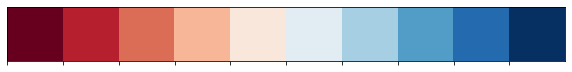

In [33]:
sns.palplot([cmap(i) for i in np.linspace(0, 1, 10)])

In [47]:
%%time
trait = 'aerobe'
level = 10
clades = internal_nodes.loc[trait, level]
print('colors')

chunks = 400
data_leaves = np_pca_data.copy(deep=True)
chunk_idx = [int(i) for i in np.linspace(0, len(data_leaves), chunks)]
colors = []
for i in range(chunks-1):
    val = data_leaves.iloc[chunk_idx[i]:chunk_idx[i+1], 0].mean()
    colors.append(cmap(val))
    
# clades = ['c000028', 'c000130']
    
# precompile chunk presence
chunk_presence = dict((c, []) for c in clades)
for c in clades:
    print(f'Compiling chunk presence for {c}')
    leaves = [l.name for l in gtdb_pruned.search_nodes(name=c)[0].get_leaves()]
    for i in range(chunks-1):
        if (data_leaves.index[chunk_idx[i]:chunk_idx[i+1]].isin(leaves).sum() > 10):
            chunk_presence[c].append(True)
        else:
            chunk_presence[c].append(False) 
    

    

colors
Compiling chunk presence for c002137
Compiling chunk presence for c010372
Compiling chunk presence for c027850
Compiling chunk presence for c000302
Compiling chunk presence for c008582
Compiling chunk presence for c000130
Compiling chunk presence for c030369
Compiling chunk presence for c000028
Compiling chunk presence for c000592
Compiling chunk presence for c000601
CPU times: user 11.2 s, sys: 56.3 ms, total: 11.2 s
Wall time: 11.2 s


plotting


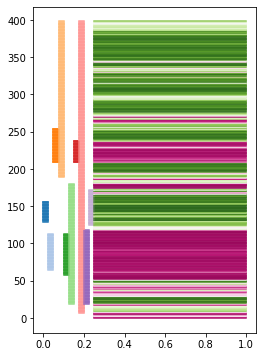

In [48]:
print('plotting')   
fig, ax = plt.subplots(figsize=(4,6))
for i in range(chunks-1):
    
    curr = 0
    for c, color, j  in zip(clades, sns.color_palette('tab20', len(clades)), np.linspace(0, 0.25, len(clades)+1)[1:]):
    
        if chunk_presence[c][i]:
            
            plt.plot((curr, j), (i, i), color=color)
            
        curr = j
        
    plt.plot((0.25,1), (i, i), color=colors[i])

In [36]:
# construct collapsing method
def collapseTree(tree, func, **collapse_args): 
    '''
    Master TreeNode collapsing function
    Collapses a TreeNode using specified leaf finding function
    '''
    # collapse tree using function
    t = Tree(tree.write(is_leaf_fn=lambda n: func(n, **collapse_args), format=3),format=3) 
    t.name = tree.name
    return t

def collapse_to_phylum(node, clades):
    '''
    collapses to phylum root nodes
    '''
    if node.is_leaf():
        return True
    elif node.up is None:
        return False
    else:
        return all([not n.name in clades for n in node.traverse(strategy='levelorder')])
    
def collapse_count(node):
    '''
    collapses to phylum root nodes
    '''
    if node.is_leaf():
        return True
    elif node.up is None:
        return False
    else:
        return len(node.get_leaves()) < 400

In [37]:
def layout_collapsed_phylum(node, clades, inc, mrc, rc):
    '''
    Layout function for tree generated by collapse_to_phylum
    '''
    # print(node.name)
    internal_ns = NodeStyle()
    if node.name in clades:
        print('yes')
        internal_ns['size'] = 10
        internal_ns['fgcolor'] = 'red'
    else:
        internal_ns['size'] = 0
        
    if node.name in inc.keys():
        internal_ns['vt_line_color'] = inc[node.name]
        internal_ns['hz_line_color'] = inc[node.name]
    
    if node.is_leaf():
        
        ringcolor = inc[node.name]
        
        R1 = RectFace(width=4, height=4, fgcolor=ringcolor, bgcolor=ringcolor)
        faces.add_face_to_node(R1, node, 0, position='aligned')
        
        Rs = RectFace(width=2, height=4, fgcolor='white', bgcolor='white')
        faces.add_face_to_node(Rs, node, 1, position='aligned')
        
        ringcolor = mrc[node.name]
        
        R1 = RectFace(width=12, height=4, fgcolor=ringcolor, bgcolor=ringcolor)
        faces.add_face_to_node(R1, node, 2, position='aligned')
        
        Rs = RectFace(width=2, height=4, fgcolor='white', bgcolor='white')
        faces.add_face_to_node(Rs, node, 3, position='aligned')
        
        ringcolor = rc[node.name]
        
        R2 = RectFace(width=12, height=4, fgcolor=ringcolor, bgcolor=ringcolor)
        faces.add_face_to_node(R2, node, 4, position='aligned')
        
        Rs = RectFace(width=2, height=4, fgcolor='white', bgcolor='white')
        faces.add_face_to_node(Rs, node, 5, position='aligned')
#         new_name = names_map.loc[node.name].split(':')[-1].split(';')[0].lstrip()
        
#         faces.add_face_to_node(TextFace(f" {new_name}", fsize=6), node, column=0)
        
#         num_leaves = len(gtdb_full.search_nodes(name=node.name)[0].get_leaves())
#         faces.add_face_to_node(TextFace(f"{num_leaves}", fsize=6), node, column=1, position='aligned')
    
#         face_color='k'
#         if num_leaves >= 1900:
            
#             face_color='red'
            
#         # face_color = node_size_cmap(len(node.get_leaves()) / 2000)
#         R1 = RectFace(width=num_leaves / 100,
#                       height=3, 
#               fgcolor=face_color,
#               bgcolor=face_color)
#         faces.add_face_to_node(R1, node, 2, position='aligned')

        
#         internal_ns['fgcolor'] = face_color
#         internal_ns['size'] = 5

    node.img_style = internal_ns

def phylum_collapse_ts(**args):
    ts = TreeStyle()
    ts.mode = 'c'
    ts.layout_fn = lambda n: layout_collapsed_phylum(n, **args)
    # ts.scale = 400
    ts.show_leaf_name = False
    ts.draw_guiding_lines = False
    
    return ts

In [38]:
%%time

# collapsing cells
collapsed_count = collapseTree(gtdb_pruned, collapse_count)
collapsed_count.describe()

Number of leaf nodes:	519
Total number of nodes:	1037
Rooted:	Yes
Most distant node:	c119086
Max. distance:	1.823740
CPU times: user 4.01 s, sys: 0 ns, total: 4.01 s
Wall time: 4.01 s


In [39]:
trait = 'phototroph'
level = 10
clades = internal_nodes.loc[trait, level]

In [40]:
cmap = plt.get_cmap('PiYG')

In [41]:
collapsed = collapseTree(gtdb_pruned, collapse_to_phylum, clades=clades)

collapsed.describe()

Number of leaf nodes:	45
Total number of nodes:	89
Rooted:	Yes
Most distant node:	GB_GCA_016718825_1
Max. distance:	0.996220


In [42]:
%%time
n_leaves = len(collapsed.get_leaves())
internal_node_colors = dict([(node.name, to_hex(color)) for (cl, color) in zip(collapsed.get_leaves(), sns.color_palette('tab20', n_leaves)) for node in gtdb_pruned.search_nodes(name=cl.name)[0].traverse()])

CPU times: user 6.81 s, sys: 5.52 ms, total: 6.82 s
Wall time: 6.82 s


In [43]:
%%time
# ring colors
get_leaf_names = lambda n: [l.name for l in gtdb_pruned.search_nodes(name=n.name)[0].get_leaves()]
clade2mean = {}
for cl in collapsed.get_leaves():
    clade2mean[cl.name] = np_pca_data.loc[get_leaf_names(cl), trait].mean()
    
mean_ring_colors = dict([(node.name, to_hex(cmap(clade2mean[cl.name]))) for cl in collapsed.get_leaves() for node in gtdb_pruned.search_nodes(name=cl.name)[0].traverse()])

CPU times: user 19.2 s, sys: 82.1 ms, total: 19.3 s
Wall time: 19.2 s


In [44]:
%%time
ring_colors = dict([(cl.name, to_hex(cmap(np_pca_data.loc[get_leaf_names(cl), trait].mean()))) for cl in collapsed_count.get_leaves()])


CPU times: user 1min 12s, sys: 11.4 ms, total: 1min 12s
Wall time: 1min 12s


yes
yes
yes
yes
yes
yes
yes
yes
yes
yes


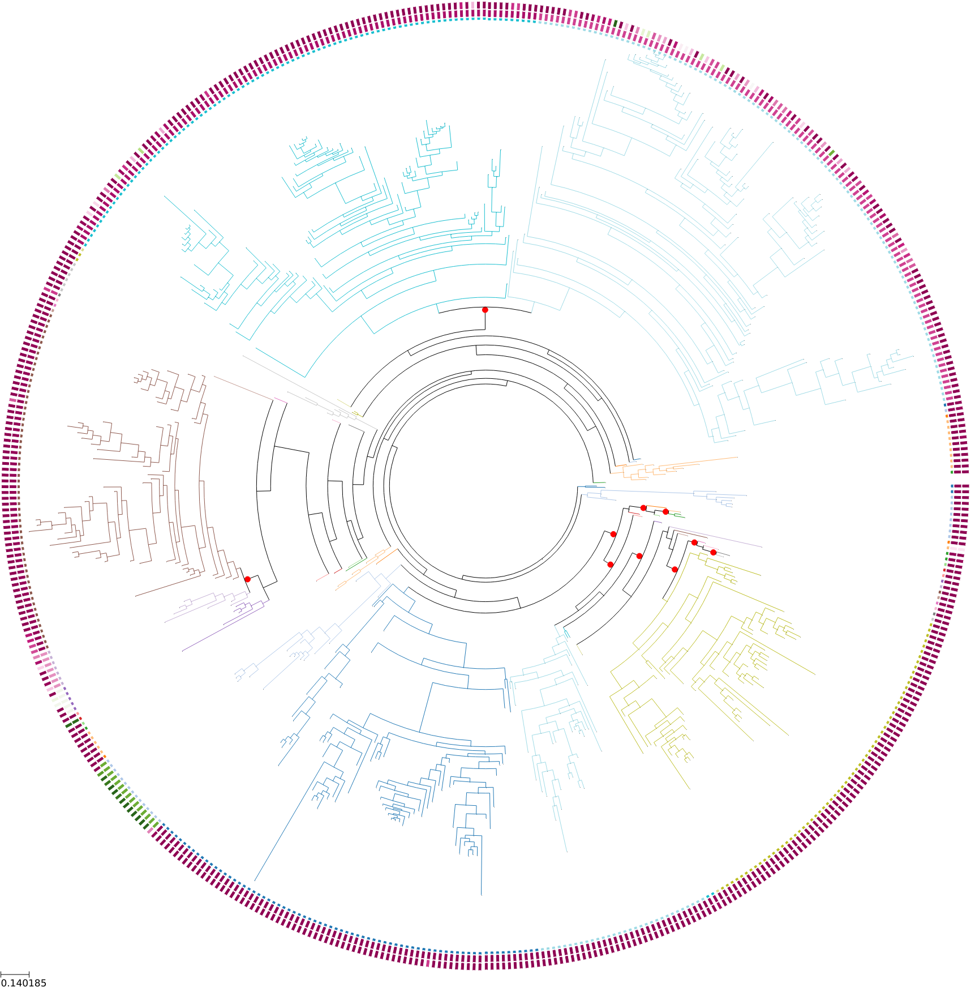

In [45]:
collapsed_count.render('%%inline', tree_style=phylum_collapse_ts(clades=clades, 
                                                                 inc=internal_node_colors, 
                                                                 mrc=mean_ring_colors,
                                                                 rc=ring_colors))

In [46]:
rendered = collapsed_count.render('/data/mhoffert/fiererlab/periodic_phyla/figures/haar_method/phototroph.png', tree_style=phylum_collapse_ts(clades=clades, 
                                                                 inc=internal_node_colors, 
                                                                 mrc=mean_ring_colors,
                                                                 rc=ring_colors))

yes
yes
yes
yes
yes
yes
yes
yes
yes
yes


# Figure 1: Example figure

In [32]:
# load tree
fig1_tree = Tree('/data/mhoffert/fiererlab/periodic_phyla/data/wavelet_data/61_otus_unannotated.tree', format=1, quoted_node_names=True)

# relabel leaves and nodes in postorder
c = 0
i = 0
for node in fig1_tree.traverse(strategy='postorder'):
    if node.is_leaf():
        node.name = f'c{c:02}'
        c += 1
    else:
        node.name = f'i{i:02}'
        i += 1

# load wavelets
with open('/data/mhoffert/fiererlab/periodic_phyla/data/wavelet_data/testtraitdata.pkl', 'rb') as handle:
    fig1_data = pickle.load(handle)

# reset index
fig1_data.index = [f'c{i:02}' for i in range(22)]
fig1_data.head()


# load wavelets
fig1_wavelets = pd.read_csv('/data/mhoffert/fiererlab/periodic_phyla/data/wavelet_data/test_centered_wavelet_coef_noisy.csv', header=None).T.iloc[:-1, :]
internal_nodes = [n.name for n in fig1_tree.traverse(strategy='postorder') if not n.is_leaf()]

fig1_wavelets.index = internal_nodes
fig1_wavelets.head()

,0,1,2
i00,0.017205,0.000000e+00,592.186061
i01,0.009933,6.938894e-18,-101.189925
i02,0.000000,0.000000e+00,136.970877
i03,0.008885,-6.938894e-18,320.640497
i04,-0.030143,1.387779e-17,-163.199411


divide by zero encountered in log10
invalid value encountered in log10


<Axes: ylabel='Count'>

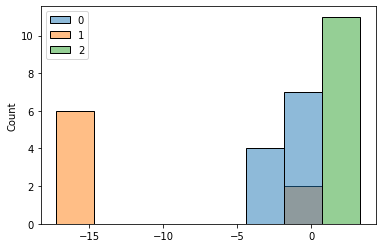

In [33]:
sns.histplot(fig1_wavelets.apply(lambda x: np.log10(x)))

In [34]:
(fig1_wavelets > 0).sum()

0    11
1     8
2    11
dtype: int64

In [35]:
fig1_wavelets = fig1_wavelets.rename(columns={0:'Trait 1', 1:'Trait 2', 2:'Trait 3'})

In [36]:
def fig1_layout(node, tip_data, wavelet_data, trait):
    '''
    Layout function for tree generated by collapse_to_phylum
    '''
    # print(node.name)
    internal_ns = NodeStyle()
    internal_ns['size'] = 0
    internal_ns['vt_line_width'] = 1
    internal_ns['hz_line_width'] = 1
    
    if node.is_leaf():
        cm = matplotlib.colormaps['gnuplot']
        if tip_data.loc[node.name, trait] != 0:
            c = to_hex(cm(tip_data.loc[node.name, trait]))
        else:
            c = '#808080'
        R1 = RectFace(width=4, height=4, fgcolor=c, bgcolor=c)
        faces.add_face_to_node(R1, node, 0, position='aligned')
    else:
        ''
        t1 = TextFace(node.name)
        faces.add_face_to_node(t1, node, 0)
        # if np.abs(wavelet_data.loc[node.name, trait]) > 1e-15:
        #     internal_ns['size'] = 10
        

    node.img_style = internal_ns

def fig1_ts(**args):
    ts = TreeStyle()
    ts.layout_fn = lambda n: fig1_layout(n, **args)
    # ts.mode = 'c'
    ts.draw_guiding_lines = True
    ts.show_leaf_name = True
    return ts
    

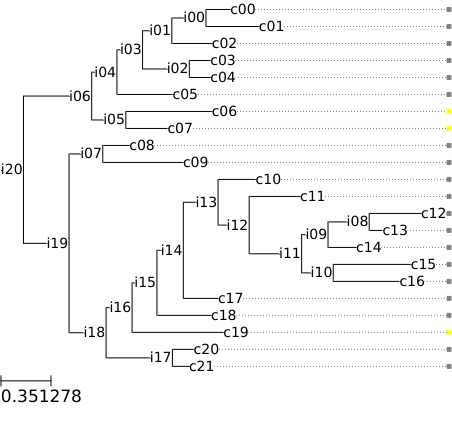

In [37]:
# fig1_tree.render('%%inline', tree_style=fig1_ts(tip_data=fig1_data, wavelet_data=fig1_wavelets, trait='Trait 2'), w=500, h=500)
fig1_tree.render('%%inline', tree_style=fig1_ts(tip_data=fig1_data, wavelet_data=fig1_wavelets, trait='Trait 2')) #, w=500, h=500)

In [38]:
rendered = fig1_tree.render('/data/mhoffert/fiererlab/periodic_phyla/figures/group_meeting_figures/fig1_tree.png', tree_style=fig1_ts(tip_data=fig1_data, wavelet_data=fig1_wavelets, trait='Trait 2'), dpi=400) #  w=500, h=500)

In [39]:
nodes = [n.name for n in fig1_tree.traverse(strategy='postorder') if not n.is_leaf()]
node_postorders = dict((n, i) for n, i in zip(nodes, np.linspace(0, 1, len(nodes))))

leaves = [l.name for l in fig1_tree.traverse(strategy='postorder') if l.is_leaf()]
leaf_postorders = dict((l, i) for l, i in zip(leaves, np.linspace(0, 1, len(leaves))))

In [40]:
def fig1_post_layout(node, n_po, l_po, color=True):
    '''
    Layout function for tree generated by collapse_to_phylum
    '''
    # print(node.name)
    internal_ns = NodeStyle()
    internal_ns['size'] = 0
    # internal_ns['vt_line_width'] = 1
    # internal_ns['hz_line_width'] = 1
    
    cm = matplotlib.colormaps['gnuplot']
    
    if node.is_leaf():
        
        c = to_hex(cm(l_po[node.name]))
        if color:
            R1 = RectFace(width=4, height=4, fgcolor=c, bgcolor=c)
            faces.add_face_to_node(R1, node, 0, position='aligned')
        
    else:
        if color:
            internal_ns['vt_line_color'] = to_hex(cm(n_po[node.name]))
            internal_ns['hz_line_color'] = to_hex(cm(n_po[node.name]))
        
    node.img_style = internal_ns

def fig1_post_ts(**args):
    ts = TreeStyle()
    ts.layout_fn = lambda n: fig1_post_layout(n, **args)
    # ts.mode = 'c'
    ts.draw_guiding_lines = True
    ts.show_leaf_name = False
    ts.branch_vertical_margin = 5
    ts.show_scale = False
    # ts.scale = 500
    return ts

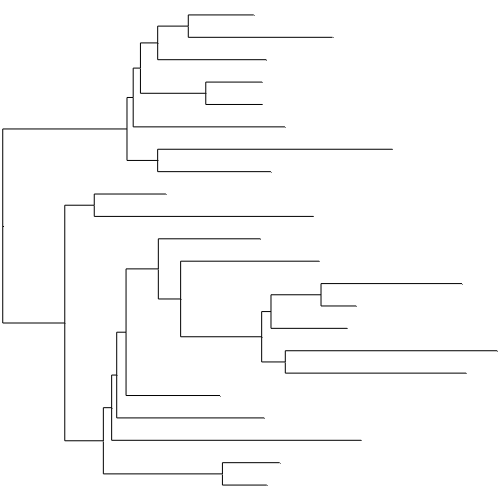

In [41]:
fig1_tree.render('%%inline', tree_style=fig1_post_ts(n_po=node_postorders, l_po=leaf_postorders, color=False), h=500, w=500)

In [42]:
rendered = fig1_tree.render('/data/mhoffert/fiererlab/periodic_phyla/figures/group_meeting_figures/fig1_tree_nolabel.png', 
                 tree_style=fig1_post_ts(n_po=node_postorders, l_po=leaf_postorders, color=False), 
                 h=500, w=500)

In [43]:
rendered = fig1_tree.render('/data/mhoffert/fiererlab/periodic_phyla/figures/group_meeting_figures/fig1_tree_nolabel_colored.png', 
                 tree_style=fig1_post_ts(n_po=node_postorders, l_po=leaf_postorders, color=True), 
                 h=500, w=500)

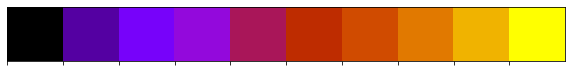

In [46]:
_cmap = cm.gnuplot
sns.palplot([_cmap(i) for i in np.linspace(0,1,10)])

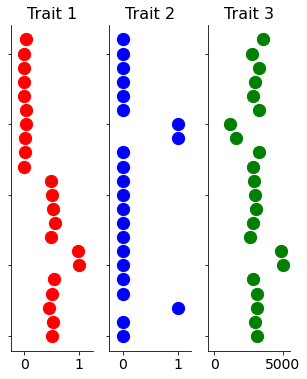

In [47]:
fig = plt.figure(figsize=(5,6))
for color, (i, col) in zip(['r', 'b', 'g'], enumerate(fig1_data.columns)):
    ax = fig.add_subplot(1,3,i+1)
    plt.scatter(y=range(len(fig1_data)), x=fig1_data.iloc[::-1][col], s=150, color=color)
    sns.despine()
    ax.set_title(col, fontsize=16)
    plt.tick_params(labelleft=False, labelsize=14)
    
    if i ==2:
        ax.set_xlim(-500, 5500)
    else:
        ax.set_xlim(-0.25, 1.25)
plt.savefig('/data/mhoffert/fiererlab/periodic_phyla/figures/group_meeting_figures/fig1_traits.png', bbox_inches='tight', dpi=400)

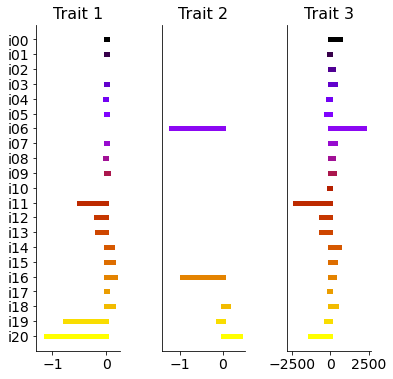

In [48]:
cm = matplotlib.colormaps['gnuplot']

fig = plt.figure(figsize=(6,6))
for i, col in enumerate(fig1_wavelets):
    ax = fig.add_subplot(1,3,i+1)
    for yval, (index, item) in enumerate(fig1_wavelets.iloc[::-1][col].items()):
        plt.plot((0, item), (yval,) * 2, color=cm(node_postorders[index]), linewidth=5)
    sns.despine()
    ax.set_title(col, fontsize=16)
    plt.tick_params(left=False, labelleft=False, labelsize=14)
    xlims = ax.get_xlim()
    ax.set_xlim(xlims[0]*1.1, xlims[1]*1.1)
    if i == 0:
        ax.set_yticks(range(len(fig1_wavelets.iloc[::-1].index)))
        ax.set_yticklabels(fig1_wavelets.iloc[::-1].index)
        plt.tick_params(left=True, labelleft=True, labelsize=14)
    # if i ==2:
    #     ax.set_xlim(-500, 5500)
    # else:
    #     ax.set_xlim(-0.25, 1.25)
    
fig.subplots_adjust(wspace=0.5)
plt.savefig('/data/mhoffert/fiererlab/periodic_phyla/figures/group_meeting_figures/fig1_wavelets.png', bbox_inches='tight', dpi=400)

In [49]:
from sklearn.manifold import TSNE

In [50]:
from scipy.optimize import linear_sum_assignment

In [51]:
def gridify(points, grid_size):
    # Generate random points in x,y space
    np.random.seed(143)  # for reproducibility

    locations = np.array(list(itertools.product(range(grid_size), range(grid_size))))

    # Define the distance function (squared Euclidean distance)
    distance = lambda point, location: np.sum((point - location) ** 2)

    # Initialize the cost matrix
    cost_matrix = np.zeros((len(points), grid_size**2))

    # Populate the cost matrix with distances
    for i, point in enumerate(points):
        for j, location in enumerate(locations):
            cost_matrix[i, j] = distance(point, location)

    # Solve the assignment problem to minimize the total distance
    row_ind, col_ind = linear_sum_assignment(cost_matrix)

    # Assign points to locations based on the optimal solution
    assignments = locations[col_ind].reshape(-1, 2)
    
    return assignments

In [55]:
ilist = ['i04', 'i05', 'i07', 'c10', 'c11', 'i09', 'i10', 'c17', 'c18', 'c19', 'i17']
i_map = dict((i, [l.name for l in fig1_tree.search_nodes(name=i)[0].get_leaves()]) for i in ilist)

rev_i_map = {}
for key, item in i_map.items():
    for i in item:
        rev_i_map[i] = key

fig1_tsne_data = fig1_data.groupby(rev_i_map).mean()

In [56]:
%%time
tsne_embedding = TSNE(n_components=2, learning_rate='auto',
                  init='random', perplexity=3, n_jobs=10).fit_transform(fig1_tsne_data.values)

CPU times: user 12min 24s, sys: 1.03 s, total: 12min 25s
Wall time: 25.3 s


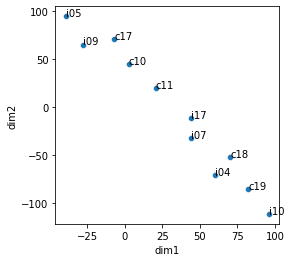

In [57]:
fig, ax = plt.subplots(figsize=(4,4))
tsne_plotdf = pd.DataFrame(tsne_embedding, columns=['dim1', 'dim2'], index=fig1_tsne_data.index)
sns.scatterplot(data=tsne_plotdf, x='dim1', y='dim2')
for index, row in tsne_plotdf.iterrows():
    ax.annotate(text=index, xy=(row['dim1'], row['dim2']))

In [58]:
grid_size = 4
tsne_grid = gridify(tsne_plotdf.values, 4)

In [59]:
tsne_grid_df = pd.DataFrame(tsne_grid, index=tsne_plotdf.index, columns=['dim1', 'dim2'])

In [60]:
grid_spots = np.array(list(itertools.product(np.linspace(tsne_plotdf['dim1'].min(),
                             tsne_plotdf['dim1'].max(),
                             grid_size),
                  np.linspace(tsne_plotdf['dim2'].min(),
                             tsne_plotdf['dim2'].max(),
                             grid_size)))).reshape(grid_size, grid_size, 2)

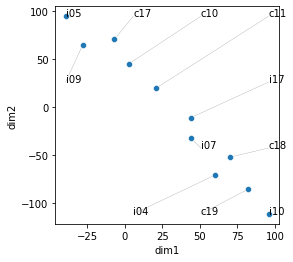

In [61]:
# plot to visualizing snapping
fig, ax = plt.subplots(figsize=(4,4))
sns.scatterplot(data=tsne_plotdf, x='dim1', y='dim2')
for index, row in tsne_grid_df.iterrows():
    grid_x, grid_y = grid_spots[tsne_grid_df.loc[index, 'dim1']][tsne_grid_df.loc[index, 'dim2']]
    plt.plot((grid_x, tsne_plotdf.loc[index, 'dim1']),
             (grid_y, tsne_plotdf.loc[index, 'dim2']), color='gray', linewidth=0.25, zorder=0)
    ax.annotate(index, (grid_x, grid_y))
# assignments

# Generating variances explained for wavelets

In [62]:
# copy of Evan's code to construct centered wavelet coefficients
BASE_PATH = "/data/mhoffert/fiererlab/periodic_phyla/data/wavelet_data/Trait_project/"
tree = Tree(f"{BASE_PATH}gtdb_tree.nw", format=1, quoted_node_names=True)
tree.name = 'c000000'

In [63]:
tree.get_children()

[Tree node 'c000001' (0x7f5fe33fb8b), Tree node 'c000014' (0x7f6003427ac)]

In [64]:
#Traverse the tree to collect internal node names
internalnodes=[]
i=0
for node in tree.traverse("postorder"):
    if not node.is_leaf():
        internalnodes.append(node.name)
        i=i+1
        
#Add the outrooting (corresponds to "scaling" wavelet)        
internalnodes.append("outroot")

In [65]:
trait_data=pd.read_csv(f'{BASE_PATH}trait_data.tsv',sep='\t') 
traits=trait_data.columns[1:]
trait_data = trait_data.drop('Unnamed: 0', axis=1)

#Mean-center each trait
trait_data_centered=trait_data.apply(lambda x: x-x.mean())

#Load wavelet transform
haarlike=scipy.sparse.load_npz(f'{BASE_PATH}Haarlike.npz')

#Recover the wavelet coefficients for each centered trait
waveletcoefs_centered=np.zeros((11,50745))
i=0
for column in trait_data_centered.columns:
    if column !='Unnamed: 0':
        subdata=[]
        subdata.append(column)
        trait=trait_data_centered[column].values
        wavelet=haarlike@trait
        waveletcoefs_centered[i,:]=wavelet
        i=i+1


waveletcoefficients_centered=pd.DataFrame(data=waveletcoefs_centered, index=traits, columns=internalnodes)  

In [66]:
trait_data.head()

,aerobe,phototroph,3HP bicycle,3HP/4HB,Calvin Cycle,rAcoA homoacetogenic,rTCA I,rTCA II,growth_rate,genome_size,gc_percentage
0,0.012481,0,0.0,0.0,0.0,0.0,0.0,0.0,3.180542,2358896,30.427073
1,0.008260,0,0.0,0.0,0.0,0.0,0.0,0.0,1.161323,3074498,42.095165
2,0.046911,0,0.0,0.0,0.0,0.0,0.0,0.0,4.600653,4400620,26.823927
3,0.081483,0,0.0,0.0,0.0,0.0,0.0,0.0,5.581473,1826176,40.947915
4,0.052110,0,0.0,0.0,0.0,0.0,0.0,0.0,2.326041,3256282,37.758278


In [67]:
waveletcoefficients_centered.head()

,c000214,c000145,c000098,c000018,c000096,c000058,c000034,c000008,c002311,c001263,...,c012988,c004769,c002192,c001622,c000869,c000088,c000028,c000014,c000000,outroot
aerobe,-0.027331,-0.012333,-5.103687e-02,-0.013261,-0.022323,-0.025685,-1.572339e-02,-7.182927e-03,-0.091844,0.160925,...,0.371015,3.996640e-01,1.249661e-01,3.071765e-01,-7.538879e-02,-0.643498,-29.234253,-9.868189,-7.048139,1.014228e-13
phototroph,0.000000,0.000000,6.938894e-18,0.000000,0.000000,0.000000,-6.938894e-18,-6.938894e-18,-0.707107,0.408248,...,0.000000,-1.387779e-17,-3.469447e-18,4.062558e-02,-1.197626e-02,0.584615,-2.717147,-1.556815,-1.192106,2.312874e-12
3HP bicycle,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000,-4.336809e-19,-4.336809e-19,0.000000,0.000000,...,0.000000,-8.673617e-19,0.000000e+00,1.344411e-17,5.692061e-19,0.066179,-0.607449,-0.115033,-0.095354,5.275525e-13
3HP/4HB,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000,-2.168404e-19,0.000000e+00,0.000000,0.000000,...,0.000000,-4.336809e-19,-3.252607e-19,-9.324139e-18,1.138412e-18,0.031104,-0.289830,-0.053650,-0.044472,-1.554456e-13
Calvin Cycle,0.000000,0.000000,1.387779e-17,0.000000,0.000000,0.000000,-6.938894e-18,-4.163336e-17,0.000000,0.000000,...,0.000000,-1.387779e-17,1.040834e-17,-3.400058e-16,-7.632783e-17,1.137290,-7.977920,-1.966558,-1.689400,4.852886e-12


In [68]:
%%time
# Calculate explained variance for each trait
# old code 
# explained_variance = np.zeros((11, 50745))
# for i in range(11):
#     percentages=[]
#     #Sort the wavelet coefficients in descending order
#     wavecoefssort=-np.sort(-abs(waveletcoefs_centered[i,:]))
#     for j in range(50745):
#         #Compute percent variance explained
#         percentages.append(np.linalg.norm(wavecoefssort[0:j])/np.linalg.norm(trait_data_centered.iloc[:,i].values))
#     explained_variance[i, :] = percentages


# Absolute value method you were doing 
# old code
# explained_absval=np.zeros((11,50745))
# for i in range(11):
#     percentages=[]
#     #Sort the wavelet coefficients in descending order
#     wavecoefssort=-np.sort(-abs(waveletcoefs_centered[i,:]))
#     for j in range(50745):
#         #Compute percent variance explained
#         percentages.append(np.sum(wavecoefssort[0:j])/np.sum(wavecoefssort))
#     explained_absval[i,:]=percentages


varexp = []
varexp_abs = []
for trait, row in waveletcoefficients_centered.iterrows():
    print(trait)
    
    # sorted absolute value version
    abs_sort = row.apply(np.abs).sort_values(ascending=False)
    
    # calculate variances explained
    # denominator: norm of trait data
    denom = np.linalg.norm(trait_data_centered.loc[:, trait].values)
    norms = [np.linalg.norm(abs_sort.iloc[0:i]) / denom for i in range(len(abs_sort))]
    
    total_abs = abs_sort.sum()
    norms_abs = [abs_sort.iloc[0:i].sum() / total_abs for i in range(len(abs_sort))]
        
    # add series per trait
    varexp.append(pd.Series(name=trait, 
                            index=abs_sort.index,
                            data=norms))
    
    # add series per trait
    varexp_abs.append(pd.Series(name=trait, 
                            index=abs_sort.index,
                            data=norms_abs))
    
    

aerobe
phototroph
3HP bicycle
3HP/4HB
Calvin Cycle
rAcoA homoacetogenic
rTCA I
rTCA II
growth_rate
genome_size
gc_percentage
CPU times: user 15min, sys: 19min 35s, total: 34min 36s
Wall time: 2min 13s


In [69]:
# calculate individual variances explained by subtracting each data from previous point
varexp_ind = []
varexp_abs_ind = []
for vec, vec_abs in zip(varexp, varexp_abs):
    print(vec.name)
    a = vec.drop('outroot').iloc[1:]
    b = vec.drop('outroot').iloc[:-1]
    varexp_ind.append(pd.Series(index=b.index, data=a.values - b.values, name=vec.name))
    
    a = vec_abs.drop('outroot').iloc[1:]
    b = vec_abs.drop('outroot').iloc[:-1]
    varexp_abs_ind.append(pd.Series(index=b.index, data=a.values - b.values, name=vec_abs.name))


aerobe
phototroph
3HP bicycle
3HP/4HB
Calvin Cycle
rAcoA homoacetogenic
rTCA I
rTCA II
growth_rate
genome_size
gc_percentage


In [70]:
varexp_ind_df = pd.concat(varexp_ind, axis=1).fillna(0)
varexp_ind_abs_df = pd.concat(varexp_abs_ind, axis=1)

In [71]:
varexp_ind_rank_df = pd.concat([i.reset_index(drop=True) for i in varexp_ind], axis=1).fillna(0)
varexp_ind_rank_abs_df = pd.concat([i.reset_index(drop=True) for i in varexp_abs_ind], axis=1)
varexp_ind_rank_df

,aerobe,phototroph,3HP bicycle,3HP/4HB,Calvin Cycle,rAcoA homoacetogenic,rTCA I,rTCA II,growth_rate,genome_size,gc_percentage
0,3.646121e-01,0.301664,0.101311,0.124410,0.223044,0.137168,0.159423,0.122057,2.605792e-01,3.122489e-01,4.970016e-01
1,1.236714e-01,0.073532,0.039811,0.049028,0.075113,0.055165,0.057262,0.046147,7.826341e-02,5.209855e-02,6.790223e-02
2,4.718858e-02,0.045727,0.028940,0.032377,0.051691,0.039675,0.043633,0.024729,6.095595e-02,4.336223e-02,3.772745e-02
3,4.063921e-02,0.034255,0.024432,0.027419,0.029243,0.031209,0.036742,0.018113,2.446363e-02,3.797500e-02,2.684838e-02
4,2.597832e-02,0.024809,0.018606,0.016978,0.022100,0.019958,0.032381,0.012033,1.780103e-02,2.835931e-02,2.532633e-02
...,...,...,...,...,...,...,...,...,...,...,...
50738,5.551115e-16,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,4.030110e-14,1.276756e-14,1.887379e-15
50739,2.220446e-16,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.320366e-14,1.254552e-14,1.443290e-15
50740,4.440892e-16,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.754152e-14,1.776357e-15,7.771561e-16
50741,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.330669e-15,6.661338e-16,9.992007e-16


# Figures 2+: clustering / cumulative sum of Haar-like wavelets

## y-axis plot of phylum labels

In [72]:
from adjustText import adjust_text

In [73]:
from sklearn.preprocessing import MinMaxScaler

In [75]:
# important
postorder_leaves = [i.name for i in gtdb_pruned.traverse(strategy='postorder') if i.is_leaf()]
postorder_nodes = [i.name for i in gtdb_pruned.traverse(strategy='postorder') if not i.is_leaf()]

In [76]:
%%time
phylum_postorder = pd.DataFrame(columns=['mean', 'start', 'stop'])
n_phylum_leaves = pd.Series()
i = 1
for clade, phylum in top_phyla_clades.items():
    display(i)
    clear_output(wait=True)
    # print(clade)
    test_leaves = [l.name for l in gtdb_pruned.search_nodes(name=clade)[0].get_leaves()]
    n_phylum_leaves.loc[clade] = len(test_leaves)
    indeces = [postorder_leaves.index(l) for l in test_leaves]
    phylum_postorder.loc[clade, :] = pd.Series(index=['mean', 'start', 'stop'],
                                                data=[np.mean(indeces), np.min(indeces), np.max(indeces)])
    
    i += 1
    

CPU times: user 39.6 s, sys: 62.4 ms, total: 39.7 s
Wall time: 39.7 s


## Test code: labeling method 1

CPU times: user 26.8 ms, sys: 0 ns, total: 26.8 ms
Wall time: 25.7 ms


<Axes: >

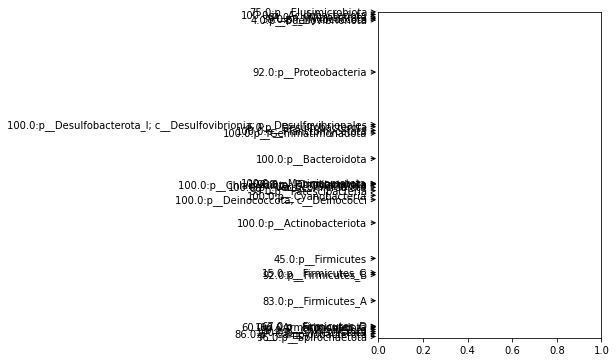

In [180]:
%%time
fig, ax = plt.subplots(figsize=(4,6))

ax.set_ylim(0, len(postorder_leaves))
ax.set_xlim(0, 1)

phylum_ylabel(ax, stripes=False, label=True)

In [182]:
test_phylum = '100.0:p__Actinobacteriota'

print(top_phyla_clades[top_phyla_clades.eq(test_phylum)])

test_leaves = set([l.name for l in gtdb_pruned.search_nodes(name='c000286')[0].get_leaves()])

test_right_leaves = set([n.name for n in gtdb_pruned.search_nodes(name='c000286')[0].get_children()[0].get_leaves()])
test_left_leaves = set([n.name for n in gtdb_pruned.search_nodes(name='c000286')[0].get_children()[1].get_leaves()])

c000286    100.0:p__Actinobacteriota
dtype: object


In [203]:
def phylum_ylabel(ax, stripes=True, label=True, xmin=0, xmax=1):
    if stripes:
        color = True
    
    texts = []
    for  phylum, c in zip(phylum_postorder.sort_values('mean').index, sns.color_palette('gist_ncar', 31)):
        
        # draw stripes, alternating colors
        if stripes:
            if color:
                c = 'orange'
            else:
                c = 'blue'
            
            y1=phylum_postorder.loc[phylum, 'start']    
            y2=phylum_postorder.loc[phylum, 'stop']
            
#             ax.fill_between(x=(xmin, xmax), y1=y1, y2=y2,
#                     color=c, zorder=0)
            
            # if the stripes are too thin to see
            if np.abs(y1 - y2) < 100:
                # draw a placeholder line
                xlims = ax.get_xlim()
                plt.plot((-0.05, -0.025), [phylum_postorder.loc[phylum, 'mean']] * 2, color='orange', linewidth=0.5, zorder=0)
                
            plt.plot((-0.05,)*2, (y1, y2), color=c, zorder=0, linewidth=5)
            
            # alternate colors on iterations
            color = not color
            
            
        # draw phylum labels along y axis
        if label:
            texts.append(ax.annotate(text=top_phyla_clades.loc[phylum], xytext=(-0.15, phylum_postorder.loc[phylum, 'mean']),
                             xy=(-0.05, phylum_postorder.loc[phylum, 'mean']), arrowprops={'arrowstyle':'->'},
                             annotation_clip=False, va='center', ha='right'))
        
        
    
    plt.tick_params(left=False, labelleft=False)
    
    return ax

    # color = not color
        
# adjust_text(texts, only_move={'text':'y'}, ha='left', ensure_inside_axes=False)    
    

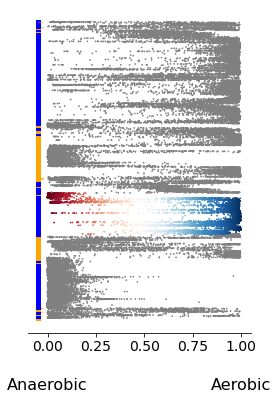

In [221]:
cmap = matplotlib.colormaps['RdBu']
# to generate plot identifying a single clade
colors = [cmap(pca_data.loc[i, 'aerobe']) if i in test_leaves else 'gray' for i in postorder_leaves]
# colors = [cmap(pca_data.loc[i, 'aerobe']) for i in postorder_leaves]

fig, ax = plt.subplots(figsize=(4, 6))

plt.scatter(pca_data.reindex(postorder_leaves)['aerobe'], range(len(postorder_leaves)),
           s=0.5,
           color=colors
           )

ax = phylum_ylabel(ax, stripes=True, label=False)


# # uncommented: draw boxes around highlighted clades
# ## start -------------------------------------------------
# yind = list(range(len(postorder_leaves)))

# left_yind = [i for i in yind if postorder_leaves[i] in test_left_leaves]
# rect1 = patches.Rectangle((-0.05, np.min(left_yind)+200), 1.1, np.max(left_yind) - np.min(left_yind), linewidth=2, edgecolor='b', facecolor='none')
# ax.add_patch(rect1)

# right_yind = [i for i in yind if postorder_leaves[i] in test_right_leaves]
# rect2 = patches.Rectangle((-0.05, np.min(right_yind)-200), 1.1, np.max(right_yind) - np.min(right_yind), linewidth=2, edgecolor='y', facecolor='none')
# ax.add_patch(rect2)
# ## stop -------------------------------------------------

sns.despine()
# ax.spines['bottom'].set_visible(False)
ax.spines['left'].set_visible(False)
plt.tick_params(labelsize=14, left=False, labelleft=False)
# ax.set_ylabel('Genomes (postorder)', fontsize=16)
xrightlabel = ax.annotate('Aerobic', (1, -1.15e4), annotation_clip=False, fontsize=16, va='center', ha='center', rotation=0)
xbottomlabel = ax.annotate('Anaerobic', (0, -1.15e4), annotation_clip=False, fontsize=16, va='center', ha='center', rotation=0)


# draw edge
# ys = []
# for i, leaf in enumerate(test_leaves):
#     if i == 0:
#         ys.append(postorder_leaves.index(leaf))
        

In [1116]:
test_leaves = [l.name for l in gtdb_pruned.search_nodes(name='c000193')[0]]

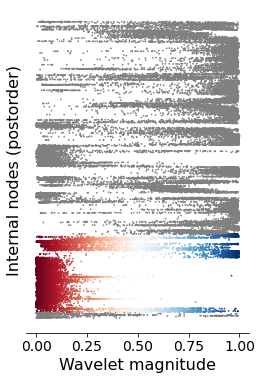

In [1117]:
cmap = matplotlib.colormaps['RdBu']
# to generate plot identifying a single clade
colors = [cmap(pca_data.loc[i, 'aerobe']) if i in test_leaves else 'gray' for i in postorder_leaves]
# colors = [cmap(pca_data.loc[i, 'aerobe']) for i in postorder_leaves]

fig, ax = plt.subplots(figsize=(4, 6))

plt.scatter(  pca_data.reindex(postorder_leaves)['aerobe'], range(len(postorder_leaves)),
           s=0.5,
         color=colors
           )


# y2 = varexp_ind_df.reindex(postorder_nodes)['aerobe'].values
# y1 = [0]*len(y2)
# x1 = range(len(y1))
# # x2 = range(len(y1))


# xlist = list(zip(x1, x1))
# ylist = list(zip(y1, y2))

# # fig, ax = plt.subplots(figsize=(4,6))
# for _x, _y in zip(xlist, ylist):
#     plt.plot(_y, _x, color='k', linewidth=2)

sns.despine()
# ax.spines['bottom'].set_visible(False)
ax.spines['left'].set_visible(False)
plt.tick_params(labelsize=14, left=False, labelleft=False)
ax.set_ylabel('Internal nodes (postorder)', fontsize=16)
ax.set_xlabel('Wavelet magnitude', fontsize=16)

# plt.savefig('/data/mhoffert/fiererlab/periodic_phyla/figures/group_meeting_figures/example_data_leaves.png', 
#             bbox_inches='tight', dpi=400)

plt.show()

<Axes: xlabel='gc_percentage', ylabel='coding_density'>

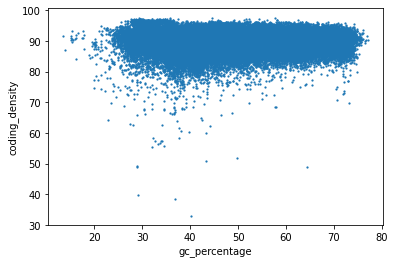

In [110]:
sns.scatterplot(data=md, x='gc_percentage', y='coding_density', linewidth=0, s=5)

<Axes: xlabel='gc_percentage', ylabel='coding_bases'>

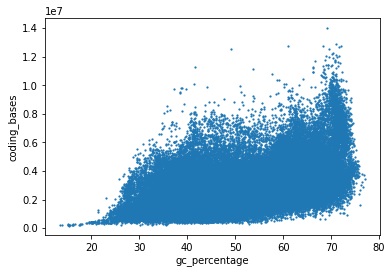

In [112]:
sns.scatterplot(data=md, x='gc_percentage', y='coding_bases', linewidth=0, s=5)

<Axes: xlabel='genome_size', ylabel='gc_percentage'>

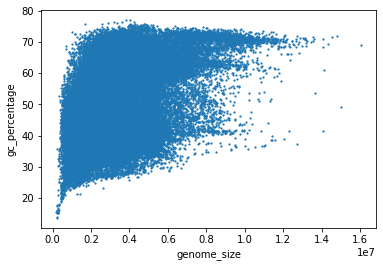

In [166]:
sns.scatterplot(data=md, x='genome_size', y='gc_percentage', linewidth=0, s=5)

In [172]:
temp = md[['genome_size', 'coding_density']].copy(deep=True)
temp['group'] = pd.cut(md['genome_size'], np.linspace(md['genome_size'].min(),
                                     md['genome_size'].max(),
                                     50))
temp = temp.groupby('group').agg({'genome_size':'mean', 'coding_density':'median'})

temp.index = [i.right for i in temp.index]

temp = temp.reset_index()

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.


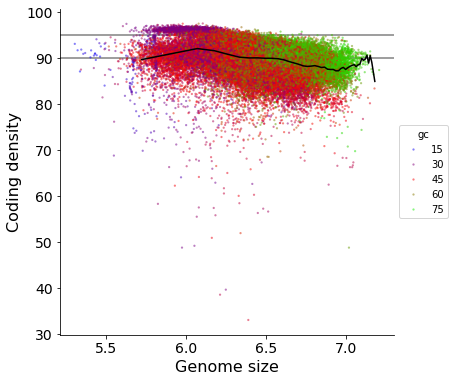

In [173]:
fig, ax = plt.subplots(figsize=(6,6))
sns.scatterplot(data=md, x=md['genome_size'].apply(np.log10), y='coding_density', 
                hue=md['gc_percentage'], palette='brg', linewidth=0, s=5, alpha=0.5)
# ax.set_xlim(1e4, 17e6)
plt.plot(np.log10(temp['index']), temp['coding_density'], color='k')

ax.axhline(90, color='gray', zorder=0)
ax.axhline(95, color='gray', zorder=0)

plt.tick_params(labelsize=14)
sns.despine()
ax.set_ylabel('Coding density', fontsize=16)
ax.set_xlabel('Genome size', fontsize=16)

lgd = ax.legend(loc='center left', bbox_to_anchor=(1, 0.5), title='gc')

<Axes: xlabel='index', ylabel='coding_density'>

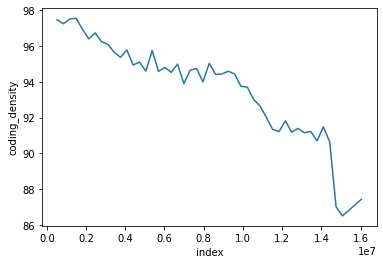

In [171]:
sns.lineplot(data=temp, x='index', y='coding_density')

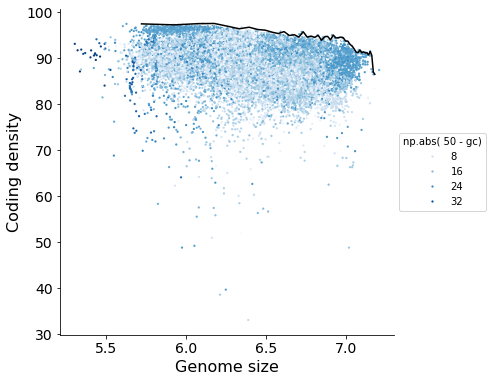

In [162]:
fig, ax = plt.subplots(figsize=(6,6))
sns.scatterplot(data=md, x=md['genome_size'].apply(np.log10), y='coding_density', 
                hue=np.abs(50 - md['gc_percentage']), palette='Blues', linewidth=0, s=5)
# ax.set_xlim(1e4, 17e6)
plt.plot(np.log10(temp['index']), temp['coding_density'], color='k')

plt.tick_params(labelsize=14)
sns.despine()
ax.set_ylabel('Coding density', fontsize=16)
ax.set_xlabel('Genome size', fontsize=16)

lgd = ax.legend(loc='center left', bbox_to_anchor=(1, 0.5), title='np.abs(50 - gc)')

In [135]:
md.groupby(pd.cut(md['genome_size'], np.linspace(md['genome_size'].min(),
                                     md['genome_size'].max(),
                                     100))).mean()

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.


TypeError: agg function failed [how->mean,dtype->object]

In [123]:
md['genome_size'].max()

16040666

In [111]:
md.columns.values

array(['accession', 'ambiguous_bases', 'checkm_completeness',
       'checkm_contamination', 'checkm_marker_count',
       'checkm_marker_lineage', 'checkm_marker_set_count',
       'checkm_strain_heterogeneity', 'coding_bases', 'coding_density',
       'contig_count', 'gc_count', 'gc_percentage', 'genome_size',
       'gtdb_genome_representative', 'gtdb_representative',
       'gtdb_taxonomy', 'gtdb_type_designation',
       'gtdb_type_designation_sources', 'gtdb_type_species_of_genus',
       'l50_contigs', 'l50_scaffolds', 'longest_contig',
       'longest_scaffold', 'lsu_23s_contig_len', 'lsu_23s_count',
       'lsu_23s_length', 'lsu_23s_query_id', 'lsu_5s_contig_len',
       'lsu_5s_count', 'lsu_5s_length', 'lsu_5s_query_id',
       'lsu_silva_23s_blast_align_len', 'lsu_silva_23s_blast_bitscore',
       'lsu_silva_23s_blast_evalue', 'lsu_silva_23s_blast_perc_identity',
       'lsu_silva_23s_blast_subject_id', 'lsu_silva_23s_taxonomy',
       'mean_contig_length', 'mean_scaffold_le

In [1112]:
gtdb_pruned.search_nodes(name='c000130')[0].get_children()
test_right_nodes = set([n.name for n in gtdb_pruned.search_nodes(name='c000130')[0].get_children()[0].traverse()])
test_left_nodes = set([n.name for n in gtdb_pruned.search_nodes(name='c000130')[0].get_children()[1].traverse()])

In [1115]:
gtdb_pruned.search_nodes(name='c000130')[0].get_children()

[Tree node 'c000193' (0x7fcf38a148e), Tree node 'c000194' (0x7fcf372add2)]

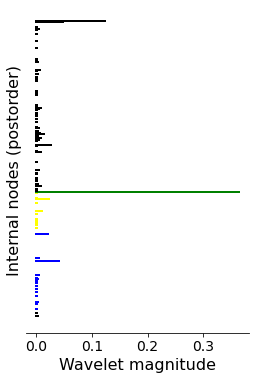

CPU times: user 1min 35s, sys: 2.19 s, total: 1min 37s
Wall time: 1min 36s


In [1114]:
%%time
cmap = matplotlib.colormaps['RdBu']
# to generate plot identifying a single clade
colors = [cmap(pca_data.loc[i, 'aerobe']) if i in test_leaves else 'gray' for i in postorder_leaves]
# colors = [cmap(pca_data.loc[i, 'aerobe']) for i in postorder_leaves]

fig, ax = plt.subplots(figsize=(4, 6))

# plt.scatter(  pca_data.reindex(postorder_leaves)['aerobe'], range(len(postorder_leaves)),
#            s=0.5,
#          color=colors
#            )


y2 = varexp_ind_df.reindex(postorder_nodes)['aerobe'].values
y1 = [0]*len(y2)
x1 = range(len(y1))
# x2 = range(len(y1))


xlist = list(zip(x1, x1))
ylist = list(zip(y1, y2))

# fig, ax = plt.subplots(figsize=(4,6))
for _x, _y, n in zip(xlist, ylist, postorder_nodes):
    if n == 'c000130':
        color= 'green'
    elif n in test_right_nodes:
        color='blue'
    elif n in test_left_nodes:
        color='yellow'
    else:
        color='k'
        
    plt.plot(_y, _x, color=color, linewidth=2)

sns.despine()
# ax.spines['bottom'].set_visible(False)
ax.spines['left'].set_visible(False)
plt.tick_params(labelsize=14, left=False, labelleft=False)
ax.set_ylabel('Internal nodes (postorder)', fontsize=16)
ax.set_xlabel('Wavelet magnitude', fontsize=16)

plt.savefig('/data/mhoffert/fiererlab/periodic_phyla/figures/group_meeting_figures/example_data_wavelets.png', 
            bbox_inches='tight', dpi=400)

plt.show()

## Test code: spacing / labeling method

In [78]:
postorder_leaf_clades= []
for index, row in phylum_postorder.sort_values('mean').iterrows():
    postorder_leaf_clades += [index] * int(row['stop'] - row['start'] + 1)

In [79]:
def spacify_data(labels, arr, space_size, insert_val):
    # Find the indices where the group changes
    L_array = np.array(labels)
    change_indices = np.where(L_array[:-1] != L_array[1:])[0] + 1

    # Create the values to insert at the change points
    inserts = np.repeat(insert_val, space_size)    
    expanded_indices = np.repeat(change_indices, space_size)

    # Insert the values into N at the appropriate locations
    return np.insert(np.array(arr, dtype=object), expanded_indices, np.repeat(insert_val, len(expanded_indices)))
    
    

done
step1
step3


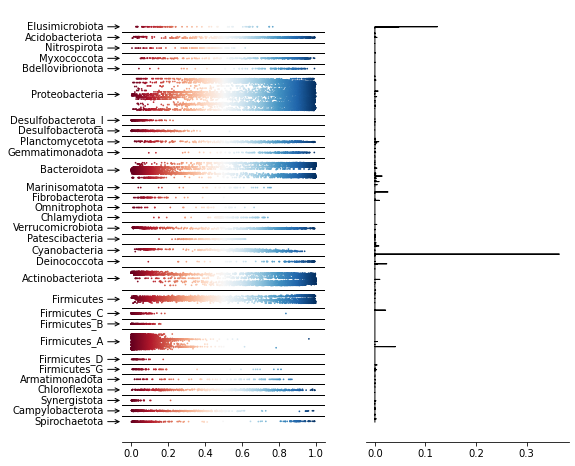

In [80]:
cmap = matplotlib.colormaps['RdBu']
# to generate plot identifying a single clade
# colors = [cmap(pca_data.loc[i, 'aerobe']) if i in test_leaves else 'gray' for i in postorder_leaves]
colors = [to_hex(cmap(pca_data.loc[i, 'aerobe'])) for i in postorder_leaves]

fig = plt.figure(figsize=(8, 8))
ax = fig.add_subplot(1,2,1)

x = pca_data.reindex(postorder_leaves)['aerobe'].values
y = list(range(len(postorder_leaves)))

space = 5000

new_x, new_c, new_labels = tuple([spacify_data(labels=postorder_leaf_clades,
                                               arr=a,
                                               space_size=space, insert_val=iv) for a, iv in zip([x, colors, postorder_leaf_clades],
                                                                                                 [np.nan, 'gray', 'None'])])

new_y = range(len(new_x))

plt.scatter(new_x, new_y,
           s=0.5,
           c=new_c)

temp = np.where(new_labels[:-1] != new_labels[1:])[0] + 1
temp = [temp[i] for i in range(0, len(temp), 2)]

for val in temp:
    ax.axhline(val+int(space / 2), linewidth=1, color='k')
    
my_list_unique = set(phylum_postorder.index)
first_index = pd.Series(dict((x, np.min(np.nonzero(new_labels == x)[0])) for x in my_list_unique))
last_index = pd.Series(dict((x, np.max(np.nonzero(new_labels == x)[0])) for x in my_list_unique))
label_loc = first_index + ((last_index - first_index) / 2).astype(int)

for clade, yloc in label_loc.items():
    ax.annotate(text=top_phyla_clades.loc[clade].split(';')[0].split('__')[-1], xytext=(-0.15, yloc),
                             xy=(-0.05,yloc), arrowprops={'arrowstyle':'->'},
                             annotation_clip=False, va='center', ha='right')
sns.despine()
plt.tick_params(left=False, labelleft=False)
print('done')
## PART 2 ------------------------------------------------------------------------------------
## PART 2 ------------------------------------------------------------------------------------

# ax = phylum_ylabel(ax, stripes=True, label=False)

ax1 = fig.add_subplot(1,2,2)
x = varexp_ind_df.reindex(postorder_nodes)['aerobe'].values
# x = np.log10(x)
y = range(len(x))
# x2 = range(len(y1))
print('step1')
new_x, new_y = tuple([spacify_data(labels=postorder_leaf_clades,
                                               arr=a,
                                               space_size=space, insert_val=iv) for a, iv in zip([x, y],
                                                                                                 [np.nan,  np.nan])])

# print('step2')
# xlist = list(zip(new_x1, new_x1))
# ylist = list(zip(new_y1, new_y2))



# new_y = range(len(new_x))

# plt.scatter(new_x, new_y,
#            s=0.5,
#            c=new_c)
print('step3')
# fig, ax = plt.subplots(figsize=(4,6))
# for _x, _y in zip(xlist, ylist):
    # plt.plot(_y, _x, color='k', linewidth=2)
plt.plot(new_x, new_y, color='k', linewidth=1)
    
for val in temp:
    ax.axhline(val+int(space / 2), linewidth=1, color='k')
    
sns.despine()
plt.tick_params(left=False, labelleft=False)

ax.spines['left'].set_visible(False)
ax1.spines['left'].set_visible(False)

(0.0, 5100.0)

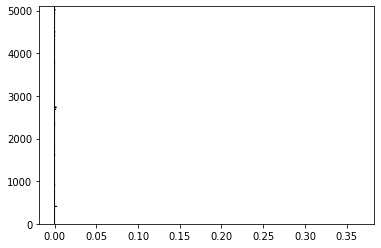

In [81]:
# zoom in: what does it look like?
fig, ax = plt.subplots(figsize=(6,4))
plt.plot(new_x, new_y, color='k', linewidth=1)
ax.set_ylim(0, 5100)

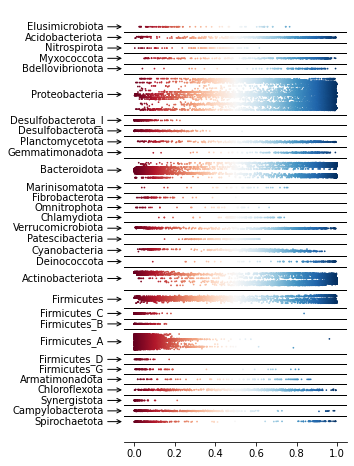

In [83]:
cmap = matplotlib.colormaps['RdBu']
# to generate plot identifying a single clade
# colors = [cmap(pca_data.loc[i, 'aerobe']) if i in test_leaves else 'gray' for i in postorder_leaves]
colors = [to_hex(cmap(pca_data.loc[i, 'aerobe'])) for i in postorder_leaves]

fig, ax = plt.subplots(figsize=(4, 8))
x = pca_data.reindex(postorder_leaves)['aerobe'].values
y = list(range(len(postorder_leaves)))

space = 5000

new_x, new_c, new_labels = tuple([spacify_data(labels=postorder_leaf_clades,
                                               arr=a,
                                               space_size=space, insert_val=iv) for a, iv in zip([x, colors, postorder_leaf_clades],
                                                                                                 [np.nan, 'gray', 'None'])])

new_y = range(len(new_x))

plt.scatter(new_x, new_y,
           s=0.5,
           c=new_c)

temp = np.where(new_labels[:-1] != new_labels[1:])[0] + 1
temp = [temp[i] for i in range(0, len(temp), 2)]

for val in temp:
    ax.axhline(val+int(space / 2), linewidth=1, color='k')
    
my_list_unique = set(phylum_postorder.index)
first_index = pd.Series(dict((x, np.min(np.nonzero(new_labels == x)[0])) for x in my_list_unique))
last_index = pd.Series(dict((x, np.max(np.nonzero(new_labels == x)[0])) for x in my_list_unique))
label_loc = first_index + ((last_index - first_index) / 2).astype(int)

for clade, yloc in label_loc.items():
    ax.annotate(text=top_phyla_clades.loc[clade].split(';')[0].split('__')[-1], xytext=(-0.15, yloc),
                             xy=(-0.05,yloc), arrowprops={'arrowstyle':'->'},
                             annotation_clip=False, va='center', ha='right')
sns.despine()
plt.tick_params(left=False, labelleft=False)
ax.spines['left'].set_visible(False)
# ax = phylum_ylabel(ax, stripes=True, label=False)

## Full figure

ox
carbone
photo
gr


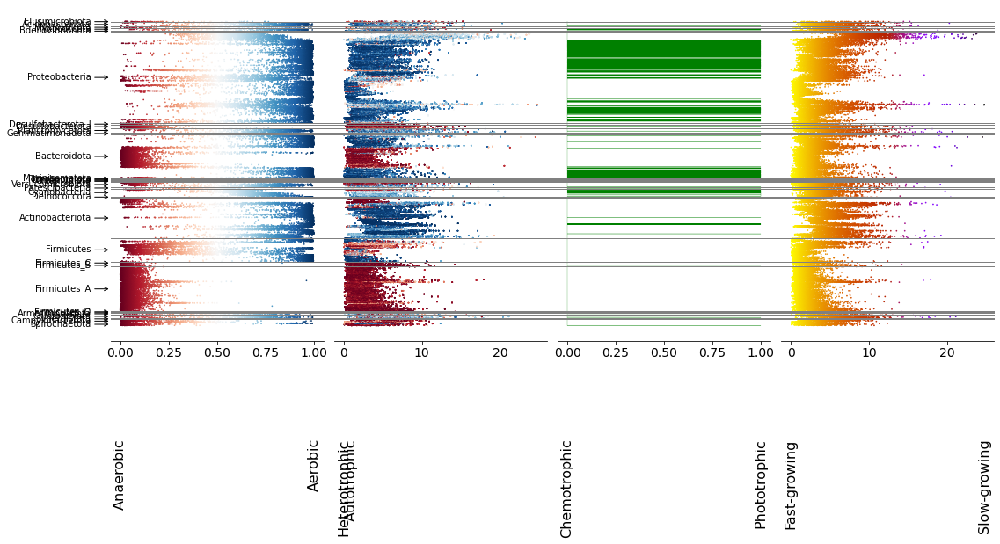

In [84]:
fig = plt.figure(figsize=(18, 7))

xlabeltop = -2e4
space = 100

## OXYGEN ---------------------------------------------------------------
## ---------------------------------------------------------------
axes = []
print('ox')
ax = fig.add_subplot(1, 4, 1)
axes.append(ax)

cmap = matplotlib.colormaps['RdBu']
colors = [to_hex(cmap(pca_data.loc[i, 'aerobe'])) for i in postorder_leaves]

x = pca_data.reindex(postorder_leaves)['aerobe'].values
y = list(range(len(postorder_leaves)))

new_x, new_c, new_labels = tuple([spacify_data(labels=postorder_leaf_clades,
                                               arr=a,
                                               space_size=space, insert_val=iv) for a, iv in zip([x, colors, postorder_leaf_clades],
                                                                                                 [np.nan, 'gray', 'None'])])

new_y = range(len(new_x))

plt.scatter(new_x, new_y,
           s=0.5,
           c=new_c)

# draw horizontal lines
temp = np.where(new_labels[:-1] != new_labels[1:])[0] + 1
temp = [temp[i] for i in range(0, len(temp), 2)]

for val in temp:
    ax.axhline(val+int(space / 2), linewidth=1, color='gray')

# label each phylum
my_list_unique = set(phylum_postorder.index)
first_index = pd.Series(dict((x, np.min(np.nonzero(new_labels == x)[0])) for x in my_list_unique))
last_index = pd.Series(dict((x, np.max(np.nonzero(new_labels == x)[0])) for x in my_list_unique))
label_loc = first_index + ((last_index - first_index) / 2).astype(int)
    
for clade, yloc in label_loc.items():
    ax.annotate(text=top_phyla_clades.loc[clade].split(';')[0].split('__')[-1], xytext=(-0.15, yloc),
                             xy=(-0.05,yloc), arrowprops={'arrowstyle':'->'},
                             annotation_clip=False, va='center', ha='right')
    
# ax = phylum_ylabel(ax, stripes=True, label=True)

sns.despine()
plt.tick_params(labelsize=14, left=False, labelleft=False)

xrightlabel = ax.annotate('Aerobic', (1, xlabeltop), annotation_clip=False, fontsize=16, va='top', ha='center', rotation=90)
xbottomlabel = ax.annotate('Anaerobic', (0, xlabeltop), annotation_clip=False, fontsize=16, va='top', ha='center', rotation=90)

# ## Carbon ---------------------------------------------------------------
# ## ---------------------------------------------------------------
print('carbone')
ax = fig.add_subplot(1, 4, 2)
axes.append(ax)
shift = 0
for column, c in zip(['3HP bicycle', '3HP/4HB', 'Calvin Cycle', 'rAcoA homoacetogenic', 'rTCA I', 'rTCA II'],
                    # ['Reds', 'Blues', 'Greys', 'Purples', 'Oranges', 'binary']):
                     ['red', 'blue', 'gray', 'purple', 'orange', 'black']):
    
    x = pca_data.reindex(postorder_leaves)['growth_rate'].values
    y = list(range(len(postorder_leaves)))

    new_x, new_c, new_labels = tuple([spacify_data(labels=postorder_leaf_clades,
                                                   arr=a,
                                                   space_size=space, insert_val=iv) for a, iv in zip([x, colors, postorder_leaf_clades],
                                                                                                     [np.nan, 'gray', 'None'])])

    new_y = range(len(new_x))

    plt.scatter(new_x, new_y,
               s=0.5,
               c=new_c)

    # draw lines
    for val in temp:
        ax.axhline(val+int(space / 2), xmin=-0.25, linewidth=1, color='gray', clip_on=False)
    
    

# ax = phylum_ylabel(ax, stripes=True, label=False)

sns.despine()
plt.tick_params(labelsize=14, left=False, labelleft=False)
# ax.spines['left'].set_visible(False)

xrightlabel = ax.annotate('Autotrophic', (1, xlabeltop), annotation_clip=False, fontsize=16, va='top', ha='center', rotation=90)
xbottomlabel = ax.annotate('Heterotrophic', (0, xlabeltop), annotation_clip=False, fontsize=16, va='top', ha='center', rotation=90)

# ## phototrophy ---------------------------------------------------------------
# ## ---------------------------------------------------------------
print('photo')
ax = fig.add_subplot(1, 4, 3)
axes.append(ax)
ax.spines['left'].set_visible(False)

x = pca_data.reindex(postorder_leaves)['phototroph'].values
y = list(range(len(postorder_leaves)))
colors = ['green'] * len(x)
new_x, new_c, new_labels = tuple([spacify_data(labels=postorder_leaf_clades,
                                               arr=a,
                                               space_size=space, insert_val=iv) for a, iv in zip([x, colors, postorder_leaf_clades],
                                                                                                 [np.nan, 'gray', 'None'])])

new_y = range(len(new_x))

plt.plot(  new_x, new_y,
           # s=0.5,
         # color=colors
            color='green',
         alpha=1,
         linewidth=0.25
           )

# ax = phylum_ylabel(ax, stripes=True, label=False)

for val in temp:
    ax.axhline(val+int(space / 2), linewidth=1, color='gray', xmin=-0.25, clip_on=False)

sns.despine()
# ax.spines['left'].set_visible(False)
plt.tick_params(labelsize=14, left=False, labelleft=False)

xrightlabel = ax.annotate('Phototrophic', (1, xlabeltop), annotation_clip=False, fontsize=16, va='top', ha='center', rotation=90)
xbottomlabel = ax.annotate('Chemotrophic', (0, xlabeltop), annotation_clip=False, fontsize=16, va='top', ha='center', rotation=90)

# ## growth rate ---------------------------------------------------------------
# ## ---------------------------------------------------------------
print('gr')
ax = fig.add_subplot(1, 4, 4)
axes.append(ax)
ax.spines['left'].set_visible(False)

cmap = matplotlib.colormaps['gnuplot_r']

column = 'growth_rate'
scaler = MinMaxScaler()
scaled = scaler.fit_transform(pca_data.reindex(postorder_leaves)[column].values.reshape(-1, 1)).reshape(1, -1)[0]
colors = [to_hex(cmap(i)) for i in scaled]

x = pca_data.reindex(postorder_leaves)['growth_rate'].values
y = list(range(len(postorder_leaves)))

new_x, new_c, new_labels = tuple([spacify_data(labels=postorder_leaf_clades,
                                               arr=a,
                                               space_size=space, insert_val=iv) for a, iv in zip([x, colors, postorder_leaf_clades],
                                                                                                 [np.nan, 'gray', 'None'])])

new_y = range(len(new_x))

plt.scatter(new_x, new_y,
           s=0.5,
           c=new_c)

# draw lines
for val in temp:
    ax.axhline(val+int(space / 2), xmin=-0.25, linewidth=1, color='gray', clip_on=False)

# ax = phylum_ylabel(ax, stripes=True, label=False)

sns.despine()
# ax.spines['bottom'].set_visible(False)
ax.spines['left'].set_visible(False)
plt.tick_params(labelsize=14, left=False, labelleft=False)

xrightlabel = ax.annotate('Slow-growing', (pca_data[column].max(), xlabeltop), annotation_clip=False, fontsize=16, va='top', ha='center', rotation=90)
xbottomlabel = ax.annotate('Fast-growing', (0, xlabeltop), annotation_clip=False, fontsize=16, va='top', ha='center', rotation=90)

fig.subplots_adjust(wspace=0.05)

for ax in axes:
    ax.spines['left'].set_visible(False)
    
plt.savefig('/data/mhoffert/fiererlab/periodic_phyla/figures/haar_method/fig2b_label.png', dpi=400, bbox_inches='tight')

## second part: wavelet transform

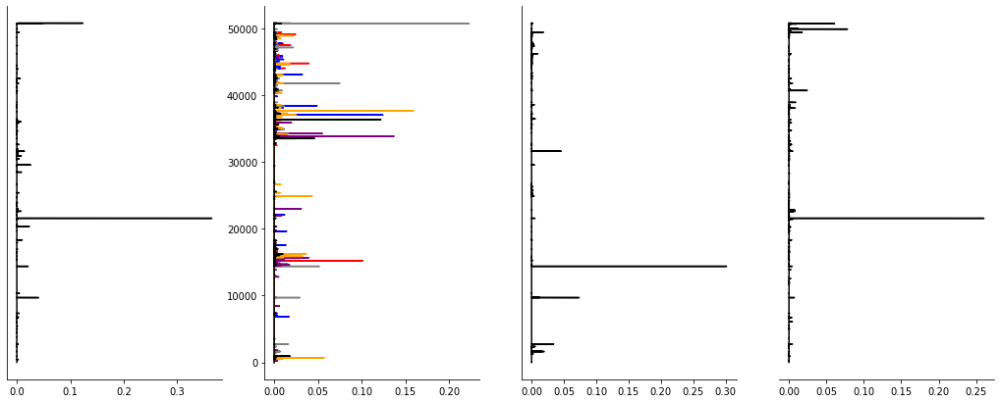

In [85]:
fig = plt.figure(figsize=(18, 7))

# aerobe
ax = fig.add_subplot(1, 4, 1)
xvals = varexp_ind_df['aerobe']
plt.plot(varexp_ind_df['aerobe'].reindex(postorder_nodes), list(range(len(xvals))), color='k')
sns.despine()
ax.spines['left'].set_visible(False)
plt.tick_params(left=False, labelleft=False)

# carbon fix
ax = fig.add_subplot(1, 4, 2)
for cycle, color in zip(['3HP bicycle', '3HP/4HB', 'Calvin Cycle', 'rAcoA homoacetogenic', 'rTCA I', 'rTCA II'],
                         ['red', 'blue', 'gray', 'purple', 'orange', 'black']):
    xvals = varexp_ind_df[cycle]
    plt.plot(varexp_ind_df[cycle].reindex(postorder_nodes), list(range(len(xvals))), color=color)

# photo
ax = fig.add_subplot(1, 4, 3)
xvals = varexp_ind_df['phototroph']
plt.plot(varexp_ind_df['phototroph'].reindex(postorder_nodes), list(range(len(xvals))), color='k')
sns.despine()
ax.spines['left'].set_visible(False)
plt.tick_params(left=False, labelleft=False)

# growth rate
ax = fig.add_subplot(1, 4, 4)
xvals = varexp_ind_df['growth_rate']
plt.plot(varexp_ind_df['growth_rate'].reindex(postorder_nodes), list(range(len(xvals))), color='k')
sns.despine()
ax.spines['left'].set_visible(False)
plt.tick_params(left=False, labelleft=False)
plt.savefig('/data/mhoffert/fiererlab/periodic_phyla/figures/haar_method/fig2c_nolabel.png', dpi=400, bbox_inches='tight')

In [86]:
varexp_ind_df['aerobe'].sort_values(ascending=False)

c000130    3.646121e-01
c000028    1.236714e-01
c000302    4.718858e-02
c008582    4.063921e-02
c030369    2.597832e-02
               ...     
c047308    4.440892e-16
c077719    2.220446e-16
c122400    0.000000e+00
c120784    0.000000e+00
c122752   -2.220446e-16
Name: aerobe, Length: 50744, dtype: float64

In [87]:
varexp_ind_df['growth_rate'].sort_values(ascending=False)

c000130    2.605792e-01
c002310    7.826341e-02
c000450    6.095595e-02
c038694    2.446363e-02
c006481    1.780103e-02
               ...     
c076885    2.320366e-14
c017384    1.754152e-14
c071695    3.330669e-15
c088834    4.440892e-16
c025030    0.000000e+00
Name: growth_rate, Length: 50744, dtype: float64

In [88]:
len(postorder_nodes)

50744

In [89]:
varexp_ind_df

,aerobe,phototroph,3HP bicycle,3HP/4HB,Calvin Cycle,rAcoA homoacetogenic,rTCA I,rTCA II,growth_rate,genome_size,gc_percentage
c000130,3.646121e-01,5.283598e-03,2.107029e-04,4.430777e-05,2.722736e-05,0.001272,4.839425e-05,2.094169e-03,2.605792e-01,3.122489e-01,4.970016e-01
c000028,1.236714e-01,1.847801e-03,9.423194e-04,4.035584e-04,1.857765e-02,0.000182,1.197432e-04,1.711030e-03,3.925120e-03,8.713255e-03,2.592307e-04
c000302,4.718858e-02,1.499170e-04,2.160817e-03,7.851155e-04,2.230438e-01,0.000189,1.004053e-04,8.337701e-03,1.060741e-02,4.226230e-03,6.790223e-02
c008582,4.063921e-02,0.000000e+00,4.337631e-08,8.349768e-07,3.939495e-08,0.000001,0.000000e+00,3.375380e-07,2.701496e-03,1.216700e-02,6.166228e-04
c030369,2.597832e-02,4.580259e-03,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,4.675621e-07,3.945521e-07,1.326306e-04,4.148533e-03,8.333835e-04
...,...,...,...,...,...,...,...,...,...,...,...
c077719,2.220446e-16,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,0.000000e+00,0.000000e+00,1.279702e-07,1.737854e-07,4.840480e-07
c047308,4.440892e-16,0.000000e+00,0.000000e+00,0.000000e+00,2.220446e-16,0.000000,0.000000e+00,0.000000e+00,1.636795e-07,1.421411e-07,1.902157e-10
c122400,0.000000e+00,-2.220446e-16,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,0.000000e+00,0.000000e+00,7.728162e-06,6.261014e-11,2.262452e-08
c122752,-2.220446e-16,2.220446e-16,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,0.000000e+00,0.000000e+00,3.852314e-05,9.419687e-12,8.148306e-10


# Individual sub-figures

## Carbon fixation

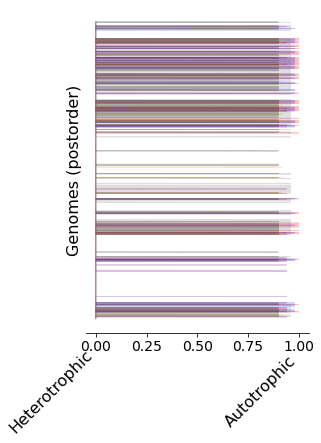

In [83]:
fig, ax = plt.subplots(figsize=(4, 6))

shift = 0
for column, c in zip(['3HP bicycle', '3HP/4HB', 'Calvin Cycle', 'rAcoA homoacetogenic', 'rTCA I', 'rTCA II'],
                    # ['Reds', 'Blues', 'Greys', 'Purples', 'Oranges', 'binary']):
                     ['red', 'blue', 'gray', 'purple', 'orange', 'black']):
    
    # cmap = matplotlib.colormaps[c]
    # colors = [cmap(pca_data.loc[i, column]) for i in postorder_leaves]
    new_x = [0 if x == 0 else x - shift for x in pca_data.reindex(postorder_leaves)[column].values]
    # plt.scatter(  x=new_x, y=range(len(postorder_leaves)),
    #            s=0.5,
    #            color=colors
    #            )
    
    plt.plot(  new_x, range(len(postorder_leaves)),
               # s=0.5,
             # color=colors
                color=c,
             alpha=0.25,
             linewidth=0.75
               )
    shift += 0.02

sns.despine()
# ax.spines['bottom'].set_visible(False)
ax.spines['left'].set_visible(False)
plt.tick_params(labelsize=14, left=False, labelleft=False)
ax.set_ylabel('Genomes (postorder)', fontsize=16)
xrightlabel = ax.annotate('Autotrophic', (1, -1.25e4), annotation_clip=False, fontsize=16, va='center', ha='right', rotation=45)
xbottomlabel = ax.annotate('Heterotrophic', (0, -1.25e4), annotation_clip=False, fontsize=16, va='center', ha='right', rotation=45)

## Phototroph

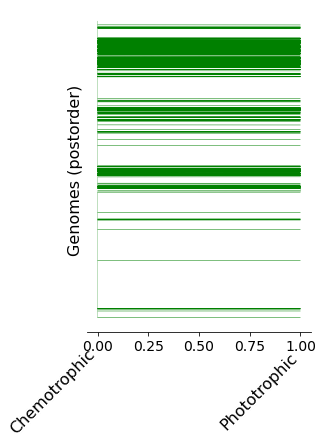

In [680]:
fig, ax = plt.subplots(figsize=(4, 6))

column='phototroph'
    
# cmap = matplotlib.colormaps['Greens']

new_x = pca_data.reindex(postorder_leaves)[column].values
# plt.scatter(  x=new_x, y=range(len(postorder_leaves)),
#            s=0.5,
#            color='green'
#            )

# plt.plot(  new_x, range(len(postorder_leaves)),
#            # s=0.5,
#            color='green',
#            linewidth = 0.1
#            )
# colors = [cmap(pca_data.loc[i, column]) for i in postorder_leaves]
plt.plot(  pca_data.reindex(postorder_leaves)['phototroph'].values, range(len(postorder_leaves)),
           # s=0.5,
         # color=colors
            color='green',
         alpha=1,
         linewidth=0.25
           )
# shift += 0.02

sns.despine()
# ax.spines['bottom'].set_visible(False)
ax.spines['left'].set_visible(False)
plt.tick_params(labelsize=14, left=False, labelleft=False)
ax.set_ylabel('Genomes (postorder)', fontsize=16)
xrightlabel = ax.annotate('Phototrophic', (1, -1.25e4), annotation_clip=False, fontsize=16, va='center', ha='right', rotation=45)
xbottomlabel = ax.annotate('Chemotrophic', (0, -1.25e4), annotation_clip=False, fontsize=16, va='center', ha='right', rotation=45)

## Growth rate

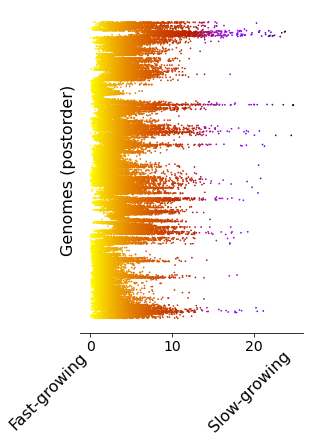

In [118]:
fig, ax = plt.subplots(figsize=(4, 6))


    
# norm = matplotlib.colors.Normalize(vmin=0, vmax=pca_data[column].max())
# mappable = matplotlib.cm.ScalarMappable(norm=norm, cmap=matplotlib.cm.gnuplot)
# cmap = mappable.get_cmap()

cmap = matplotlib.colormaps['gnuplot_r']

column = 'growth_rate'
scaler = MinMaxScaler()
scaled = scaler.fit_transform(pca_data.reindex(postorder_leaves)[column].values.reshape(-1, 1)).reshape(1, -1)[0]
colors = [cmap(i) for i in scaled]

# new_x = [0 if x == 0 else x - shift for x in pca_data.reindex(postorder_leaves)[column].values]
plt.scatter(  x=pca_data.reindex(postorder_leaves)[column].values, y=range(len(postorder_leaves)),
           s=0.5,
           color=colors
           )
# # colors = [cmap(pca_data.loc[i, column]) for i in postorder_leaves]
# plt.plot(  pca_data.reindex(postorder_leaves)['phototroph'].values, range(len(postorder_leaves)),
#            # s=0.5,
#          # color=colors
#             color='green',
#          alpha=1,
#          linewidth=0.25
#            )
# shift += 0.02

sns.despine()
# ax.spines['bottom'].set_visible(False)
ax.spines['left'].set_visible(False)
plt.tick_params(labelsize=14, left=False, labelleft=False)
ax.set_ylabel('Genomes (postorder)', fontsize=16)
xrightlabel = ax.annotate('Slow-growing', (pca_data[column].max(), -1.25e4), annotation_clip=False, fontsize=16, va='center', ha='right', rotation=45)
xbottomlabel = ax.annotate('Fast-growing', (0, -1.25e4), annotation_clip=False, fontsize=16, va='center', ha='right', rotation=45)

In [332]:
y2 = varexp_ind_df.reindex(postorder_nodes)['aerobe'].values
y1 = [0]*len(y2)
x1 = range(len(y1))
# x2 = range(len(y1))

xlist = list(zip(x1, x1))
ylist = list(zip(y1, y2))

fig, ax = plt.subplots(figsize=(4,6))
for _x, _y in zip(xlist, ylist):
    plt.plot(_y, _x, color='k', linewidth=2)

sns.despine()
# ax.spines['bottom'].set_visible(False)
ax.spines['left'].set_visible(False)
plt.tick_params(labelsize=14, left=False, labelleft=False)
ax.set_ylabel('Internal nodes (postorder)', fontsize=16)
ax.set_xlabel('Wavelet magnitude', fontsize=16)
plt.show()

In [328]:
test_left_nodes = set([n.name for n in gtdb_pruned.search_nodes(name='c000130')[0].get_children()[0].traverse()])
test_right_nodes = set([n.name for n in gtdb_pruned.search_nodes(name='c000130')[0].get_children()[1].traverse()])
def get_color(n, l, r, c):
    if n == c:
        return 'g'
    elif n in l:
        return 'y'
    elif n in r:
        return 'b'
    else:
        return 'gray'
colors = [get_color(n, test_left_nodes, test_right_nodes, 'c000130') for n in postorder_nodes]

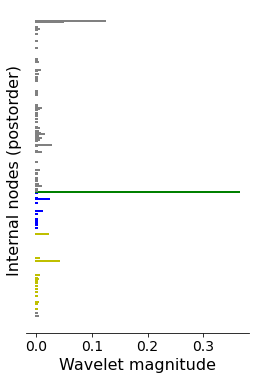

CPU times: user 49.4 s, sys: 1.6 s, total: 51 s
Wall time: 50.8 s


In [329]:
%%time
fig, ax = plt.subplots(figsize=(4, 6))
for _x, _y, _c in zip(xlist, ylist, colors):
    plt.plot(_y, _x, color=_c, linewidth=2)

sns.despine()
# ax.spines['bottom'].set_visible(False)
ax.spines['left'].set_visible(False)
plt.tick_params(labelsize=14, left=False, labelleft=False)
ax.set_ylabel('Internal nodes (postorder)', fontsize=16)
ax.set_xlabel('Wavelet magnitude', fontsize=16)
plt.show()

In [330]:
test_left_leaves = set([n.name for n in gtdb_pruned.search_nodes(name='c000130')[0].get_children()[0].get_leaves()])
test_right_leaves = set([n.name for n in gtdb_pruned.search_nodes(name='c000130')[0].get_children()[1].get_leaves()])
def get_color(n, l, r, c):
    if n == c:
        return 'g'
    elif n in l:
        return 'y'
    elif n in r:
        return 'b'
    else:
        return 'gray'
colors = [get_color(n, test_left_leaves, test_right_leaves, 'c000130') for n in postorder_leaves]

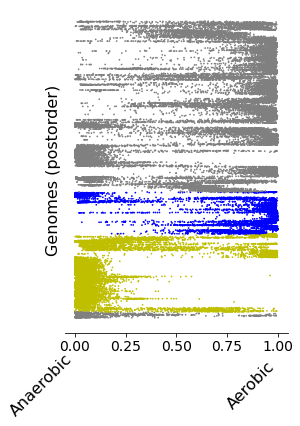

In [331]:
fig, ax = plt.subplots(figsize=(4, 6))

plt.scatter(  pca_data.reindex(postorder_leaves)['aerobe'], range(len(postorder_leaves)),
           s=0.5,
         color=colors
        )

sns.despine()
# ax.spines['bottom'].set_visible(False)
ax.spines['left'].set_visible(False)
plt.tick_params(labelsize=14, left=False, labelleft=False)
ax.set_ylabel('Genomes (postorder)', fontsize=16)
xrightlabel = ax.annotate('Aerobic', (1, -1.15e4), annotation_clip=False, fontsize=16, va='center', ha='right', rotation=45)
xbottomlabel = ax.annotate('Anaerobic', (0, -1.15e4), annotation_clip=False, fontsize=16, va='center', ha='right', rotation=45)

In [302]:
varexp_ind_df.reindex(postorder_nodes)['aerobe'].sort_values(ascending=False)

c000130    3.646121e-01
c000028    1.236714e-01
c000302    4.718858e-02
c008582    4.063921e-02
c030369    2.597832e-02
               ...     
c047308    4.440892e-16
c077719    2.220446e-16
c122400    0.000000e+00
c120784    0.000000e+00
c122752   -2.220446e-16
Name: aerobe, Length: 50744, dtype: float64

In [250]:
'''
Old code for spacing things out
'''
# %%time
# phylum_postorder = pd.Series()
# n_phylum_leaves = pd.Series()
# for clade, phylum in top_phyla_clades.items():
#     # print(clade)
#     test_leaves = [l.name for l in gtdb_pruned.search_nodes(name=clade)[0].get_leaves()]
#     n_phylum_leaves.loc[clade] = len(test_leaves)
#     indeces = [postorder_leaves.index(l) for l in test_leaves]
#     phylum_postorder.loc[clade] = np.mean(indeces)

# n_phylum_leaves.max()

# new_x = []
# new_y = []
# start = 0
# new_colors = []
# for phylum, rank in phylum_postorder.rank().sort_values().items():
#     print(phylum)
#     space = int((n_phylum_leaves.max() - n_phylum_leaves.loc[phylum]) / 2)
#     # add first space
#     new_y += list(range(start, start + space))
#     new_x += [np.nan] * space
#     new_colors += ['k'] * space
#     start = start + space
    
#     # add actual data
#     leaves = [l.name for l in gtdb_pruned.search_nodes(name=phylum)[0].get_leaves()]
#     new_y += list(range(start, start + len(leaves)))
#     new_x += list(pca_data.loc[leaves, 'aerobe'].values)
#     new_colors += [cmap(i) for i in pca_data.loc[leaves, 'aerobe'].values]
#     start = start + len(leaves)
    
#     # add second space
#     new_y += list(range(start, start + space))
#     new_x += [np.nan] * space
#     new_colors += ['k'] * space
#     start = start + space     

# fig, ax = plt.subplots(figsize=(4, 6))

# plt.scatter(  new_x, new_y,
#            s=0.5,
#          color=new_colors
#         )

# sns.despine()
# # ax.spines['bottom'].set_visible(False)
# ax.spines['left'].set_visible(False)
# plt.tick_params(labelsize=14, left=False, labelleft=False)
# ax.set_ylabel('Genomes (postorder)', fontsize=16)
# xrightlabel = ax.annotate('Aerobic', (1, -1.15e4), annotation_clip=False, fontsize=16, va='center', ha='right', rotation=45)
# xbottomlabel = ax.annotate('Anaerobic', (0, -1.15e4), annotation_clip=False, fontsize=16, va='center', ha='right', rotation=45)

In [164]:
len(gtdb_full.search_nodes(name='c001128')[0].get_leaves())

4216

In [138]:
names_map.loc['c000592']

'21.0'

In [ ]:
gtdb_pruned.search_nodes')

In [123]:
top_phyla

Index(['Acidobacteriota', 'Actinobacteriota', 'Armatimonadota', 'Bacteroidota',
       'Bdellovibrionota', 'Campylobacterota', 'Chlamydiota', 'Chloroflexota',
       'Cyanobacteria', 'Deinococcota', 'Desulfobacterota',
       'Desulfobacterota_I', 'Elusimicrobiota', 'Fibrobacterota', 'Firmicutes',
       'Firmicutes_A', 'Firmicutes_B', 'Firmicutes_C', 'Firmicutes_D',
       'Firmicutes_G', 'Gemmatimonadota', 'Marinisomatota', 'Myxococcota',
       'Nitrospirota', 'Omnitrophota', 'Patescibacteria', 'Planctomycetota',
       'Proteobacteria', 'Spirochaetota', 'Synergistota', 'Verrucomicrobiota'],
      dtype='object', name='Phylum')

In [112]:
temp = ax.spines['left']

In [113]:
temp.set_visible()

# Figure 4+: Periodic table

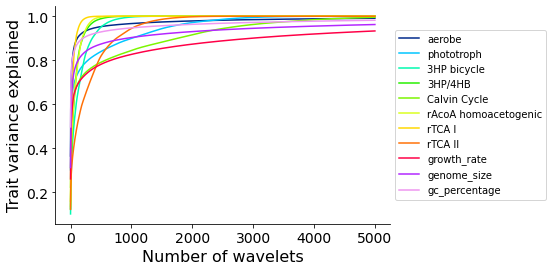

In [90]:
fig, ax = plt.subplots(figsize=(6,4))
plotdf = varexp_ind_rank_df.cumsum().head(5000).stack().reset_index()
sns.lineplot(data=plotdf, x='level_0', hue='level_1', y=0, palette='gist_ncar')
plt.tick_params(labelsize=14)
sns.despine()
lgd = ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
ax.set_ylabel('Trait variance explained', fontsize=16)
ax.set_xlabel('Number of wavelets', fontsize=16)
plt.savefig('/data/mhoffert/fiererlab/periodic_phyla/figures/group_meeting_figures/wavelet_variance_curves.png',
           bbox_inches='tight', dpi=400)

<Axes: xlabel='level_0', ylabel='0'>

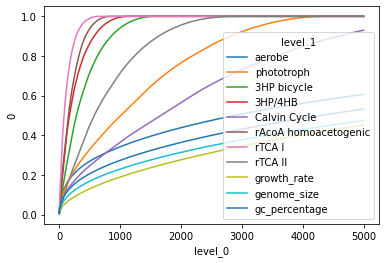

In [91]:
plotdf = varexp_ind_rank_abs_df.cumsum().head(5000).stack().reset_index()
sns.lineplot(data=plotdf, x='level_0', hue='level_1', y=0, palette='tab10')

In [92]:
all_interior_nodes = [n.name for n in gtdb_pruned.traverse(strategy='postorder') if not n.is_leaf()]

In [93]:
trait_colors = {'aerobe':'red', 'phototroph':'green', 
                '3HP bicycle':'aqua', '3HP/4HB':'lightskyblue', 'Calvin Cycle':'blue', 'rAcoA homoacetogenic':'navy', 'rTCA I':"darkturquoise", 'rTCA II':'turquoise',
                'growth_rate':'yellow', 'genome_size':'darkorchid', 'gc_percentage':'orange'}

In [94]:
varexp_ind_df

,aerobe,phototroph,3HP bicycle,3HP/4HB,Calvin Cycle,rAcoA homoacetogenic,rTCA I,rTCA II,growth_rate,genome_size,gc_percentage
c000130,3.646121e-01,5.283598e-03,2.107029e-04,4.430777e-05,2.722736e-05,0.001272,4.839425e-05,2.094169e-03,2.605792e-01,3.122489e-01,4.970016e-01
c000028,1.236714e-01,1.847801e-03,9.423194e-04,4.035584e-04,1.857765e-02,0.000182,1.197432e-04,1.711030e-03,3.925120e-03,8.713255e-03,2.592307e-04
c000302,4.718858e-02,1.499170e-04,2.160817e-03,7.851155e-04,2.230438e-01,0.000189,1.004053e-04,8.337701e-03,1.060741e-02,4.226230e-03,6.790223e-02
c008582,4.063921e-02,0.000000e+00,4.337631e-08,8.349768e-07,3.939495e-08,0.000001,0.000000e+00,3.375380e-07,2.701496e-03,1.216700e-02,6.166228e-04
c030369,2.597832e-02,4.580259e-03,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,4.675621e-07,3.945521e-07,1.326306e-04,4.148533e-03,8.333835e-04
...,...,...,...,...,...,...,...,...,...,...,...
c077719,2.220446e-16,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,0.000000e+00,0.000000e+00,1.279702e-07,1.737854e-07,4.840480e-07
c047308,4.440892e-16,0.000000e+00,0.000000e+00,0.000000e+00,2.220446e-16,0.000000,0.000000e+00,0.000000e+00,1.636795e-07,1.421411e-07,1.902157e-10
c122400,0.000000e+00,-2.220446e-16,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,0.000000e+00,0.000000e+00,7.728162e-06,6.261014e-11,2.262452e-08
c122752,-2.220446e-16,2.220446e-16,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,0.000000e+00,0.000000e+00,3.852314e-05,9.419687e-12,8.148306e-10


In [95]:
# code to calculate number of wavelets selected at different amounts of variance
cutoff_test = pd.Series(index=pd.MultiIndex.from_product([varexp_ind_df.columns, np.linspace(0, 1, 101)]), dtype=int)
all_selected = dict((trait, {}) for trait in varexp_ind_df.columns)
for (trait, cutoff), val in cutoff_test.items():
    display(trait, cutoff)
    clear_output(wait=True)
    top_n_wavelets = {}
    # make a dictionary with each node as keys
    # and the list of traits where that node was selected as values
    subset = varexp_ind_df[trait].sort_values(ascending=False).cumsum().loc[lambda x: x < cutoff]
    all_selected[trait][cutoff] = list(subset.index)
    cutoff_test.loc[(trait, cutoff)] = len(subset)

        # for key, val in subset.items():
        #     if not key in top_n_wavelets.keys():
        #         top_n_wavelets[key] = [col]
        #     else:
        #         top_n_wavelets[key].append(col)

'gc_percentage'

1.0

In [96]:
total_selected = pd.Series()
for cutoff in np.linspace(0, 1, 101):
    display(cutoff)
    clear_output(wait=True)
    curr_list = []
    for trait in all_selected.keys():

        curr_list += all_selected[trait][cutoff]
    total_selected.loc[cutoff] = len(set(curr_list))

1.0

In [97]:
total_selected

0.00        0
0.01        0
0.02        0
0.03        0
0.04        0
        ...  
0.96    14662
0.97    17881
0.98    22533
0.99    29819
1.00    50744
Length: 101, dtype: int64

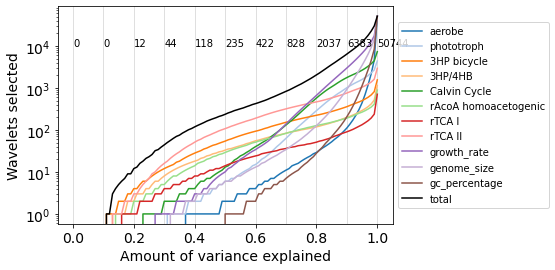

In [98]:
fig, ax = plt.subplots(figsize=(6,4))
sns.lineplot(data=cutoff_test.reset_index(), hue='level_0', x='level_1', y=0, palette='tab20')
sns.lineplot(total_selected, label='total', color='k')
for val in range(0, 101, 10):
    x = total_selected.index[val]
    ax.annotate(f'{total_selected.iloc[val]}', 
                (x, 1e4), 
                (x, 1e4))

# for i in [1, 10, 100, 1000]:
#     ax.axhline(i, color='k', zorder=0, alpha=0.25, linewidth=0.5)
    
for i in np.linspace(0, 1, 11):
    ax.axvline(i, color='k', zorder=0, alpha=0.25, linewidth=0.5)

ax.set_yscale('log')
lgd = ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.tick_params(labelsize=14)
ax.set_xlabel('Amount of variance explained', fontsize=14)
ax.set_ylabel('Wavelets selected', fontsize=14)
plt.savefig('/data/mhoffert/fiererlab/periodic_phyla/figures/group_meeting_figures/num_wavelets_variance.png',
           dpi=400, bbox_inches='tight')

(0.0, 1000.0)

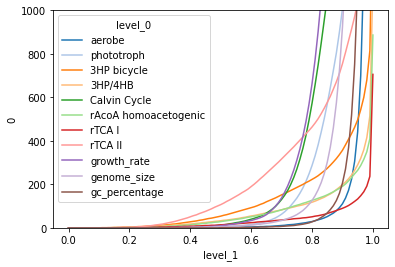

In [100]:
fig, ax = plt.subplots(figsize=(6,4))
sns.lineplot(data=cutoff_test.reset_index(), hue='level_0', x='level_1', y=0, palette='tab20')
ax.set_ylim(0, 1000)

In [721]:
top_n_wavelets = dict((cutoff, {}) for cutoff in [0.1, 0.25, 0.5, 0.6, 0.75, 0.85])

# make a dictionary with each node as keys
# and the list of traits where that node was selected as values
to_drop = ['3HP/4HB', 'rTCA II']

for cutoff in top_n_wavelets.keys():
    print(cutoff)
    for col in varexp_ind_df.drop(to_drop, axis=1).columns:
        subset = varexp_ind_df[col].sort_values(ascending=False).cumsum().loc[lambda x: x < cutoff]
        # print(col, len(subset))

        for key, val in subset.items():
            if not key in top_n_wavelets[cutoff].keys():
                top_n_wavelets[cutoff][key] = [col]
            else:
                top_n_wavelets[cutoff][key].append(col)

0.1
0.25
0.5
0.6
0.75
0.85


In [722]:
all_wavelets = list(set([i for i in top_n_wavelets[cutoff] for cutoff in top_n_wavelets.keys()]))

In [723]:
n_leaves = pd.Series()
for i, n in enumerate(gtdb_pruned.traverse()):
    if i % 1000 == 0:
        display(i)
        clear_output(wait=True)
    if n.name in all_wavelets:
        n_leaves.loc[n.name] = len(n.get_leaves())

101000

In [724]:
wavelet_node_data = pd.DataFrame(columns=['n_leaves', 'n_traits'])
cutoff = 0.75
for i, node in enumerate(list(top_n_wavelets[cutoff].keys())):
    if i % 50 == 0:
        display(i / len(top_n_wavelets[cutoff].keys()))
        clear_output(wait=True)
    
    # ?tree_node = gtdb_pruned.search_nodes(name=node)[0]
    wavelet_node_data.loc[node, 'n_leaves'] = n_leaves.loc[node]
    wavelet_node_data.loc[node, 'n_traits'] = len(top_n_wavelets[cutoff][node])

0.9922822491730982

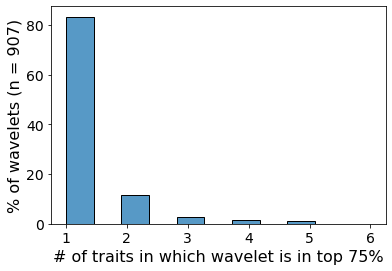

In [725]:
fig, ax = plt.subplots(figsize=(6,4))
sns.histplot(wavelet_node_data['n_traits'], stat='percent')
ax.set_ylabel(f'% of wavelets (n = {len(wavelet_node_data)})', fontsize=16)
ax.set_xlabel(f'# of traits in which wavelet is in top {cutoff * 100:.0f}%', fontsize=16)
plt.tick_params(labelsize=14)
# ax.set_yscale('log')

Text(0.5, 1.0, 'Variance explained using 907 wavelets')

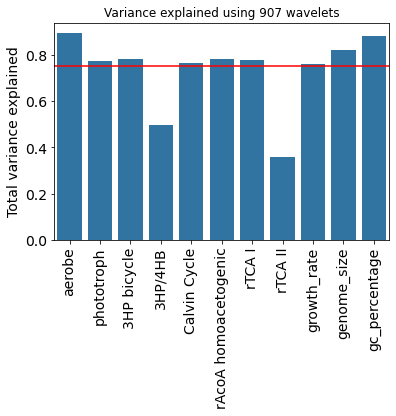

In [727]:
# total amount of variance captured by wavelets
cutoff = 0.75
selected = list(top_n_wavelets[cutoff].keys())
fig, ax = plt.subplots(figsize=(6, 4))
sns.barplot(varexp_ind_df.loc[selected].sum())
ax.axhline(cutoff, color='r')
plt.tick_params(labelsize=14)
plt.tick_params(rotation=90, axis='x')
ax.set_ylabel('Total variance explained', fontsize=14)
ax.set_title(f'Variance explained using {len(selected)} wavelets')

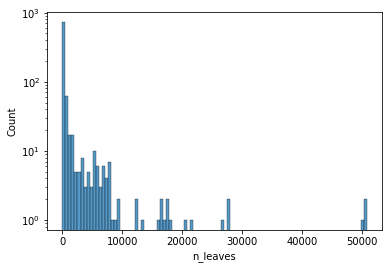

In [728]:
fig, ax = plt.subplots(figsize=(6,4))
sns.histplot(wavelet_node_data['n_leaves'], bins=100)
ax.set_yscale('log')

### Make tree with tips of all trait wavelets so far

This code is a little complicated:
1. First, make a collapsed tree representing the clades identified by the wavelets. 
2. Make a color map that allows you to color the branches of the entire clade in the same color.
3. Make a second tree with MORE LEAVES than the wavelet tree.
4. Make a color map for each leaf with the average value for a specific trait according to the wavelet tree.
5. Make a third color map with the average value for each leaf.

In [729]:
# define collapsing function
# if there are no wavelets in the subtree
# construct collapsing method
def collapseTree(tree, func, **collapse_args): 
    '''
    Master TreeNode collapsing function
    Collapses a TreeNode using specified leaf finding function
    '''
    # collapse tree using function
    t = Tree(tree.write(is_leaf_fn=lambda n: func(n, **collapse_args), format=3),format=3) 
    t.name = tree.name
    return t

def collapse_to_wavelets(node, wavelet_clades):
    '''
    collapses to phylum root nodes
    '''
    if node.is_leaf():
        return True
    elif node.up is None:
        return False
    else:
        return all([not n.name in wavelet_clades for n in node.traverse(strategy='levelorder')])

def collapse_count(node, n, keep_nodes):
    '''
    collapses to phylum root nodes
    '''
    if node.is_leaf():
        return True
    elif node.up is None:
        return False
    elif any([n.name in keep_nodes for n in node.traverse(strategy='levelorder')]):
        return False
    else:
        return len(node.get_leaves()) < n

In [730]:
%%time
wavelet_tree_sizes = pd.DataFrame(columns=['n_leaves', 'frac_captured_80'])

for cutoff in top_n_wavelets.keys():
    print(cutoff)
    # make a wavelet tree
    wavelet_tree = collapseTree(gtdb_pruned, collapse_to_wavelets, wavelet_clades=list(top_n_wavelets[cutoff].keys()))
    # wavelet_tree.describe()
    wavelet_tree_sizes.loc[cutoff, 'n_leaves'] = len(wavelet_tree.get_leaves())
    n_leaves = pd.Series()
    wavelet_leaves = set([l.name for l in wavelet_tree.get_leaves()])
    for i, n in enumerate(gtdb_pruned.traverse()):
        if i % 1000 == 0:
            display(i)
            clear_output(wait=True)
        if n.name in wavelet_leaves:
            n_leaves.loc[n.name] = len(n.get_leaves())
    leaf_fractions = (n_leaves.sort_values(ascending=False).cumsum() / n_leaves.sum())
    wavelet_tree_sizes.loc[cutoff, 'frac_captured_80'] = len(leaf_fractions.loc[lambda x: x < 0.8])

CPU times: user 9min 47s, sys: 1.23 s, total: 9min 49s
Wall time: 9min 48s


<Axes: xlabel='n_leaves', ylabel='frac_captured_80'>

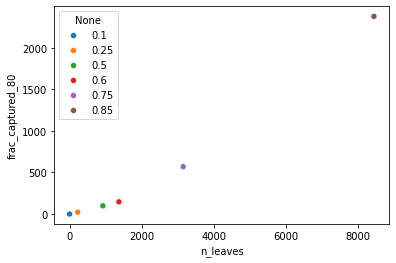

In [731]:
sns.scatterplot(x=wavelet_tree_sizes['n_leaves'],
                y=wavelet_tree_sizes['frac_captured_80'],
                hue=wavelet_tree_sizes.index, palette='tab10')

In [732]:
wavelet_tree_sizes

,n_leaves,frac_captured_80
0.10,2,0
0.25,228,23
0.50,926,98
0.60,1370,146
0.75,3152,569
0.85,8443,2378


### Analysis of wavelet tree

In [733]:
cutoff = 0.6
wavelet_tree = collapseTree(gtdb_pruned, collapse_to_wavelets, wavelet_clades=list(top_n_wavelets[cutoff].keys()))

In [734]:
n_leaves = pd.Series()
wavelet_leaves = set([l.name for l in wavelet_tree.get_leaves()])
for i, n in enumerate(gtdb_pruned.traverse()):
    if i % 1000 == 0:
        display(i)
        clear_output(wait=True)
    if n.name in wavelet_leaves:
        n_leaves.loc[n.name] = len(n.get_leaves())

101000

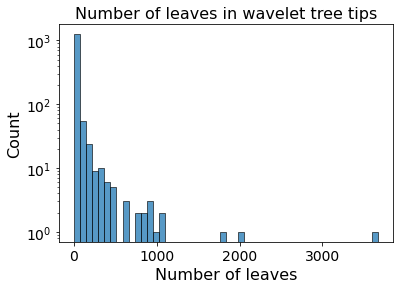

In [735]:
fig, ax = plt.subplots(figsize=(6,4))
sns.histplot(n_leaves, bins=50)
ax.set_yscale('log')
ax.set_title('Number of leaves in wavelet tree tips', fontsize=16)
ax.set_ylabel('Count', fontsize=16)
ax.set_xlabel('Number of leaves', fontsize=16)
plt.tick_params(labelsize=14)

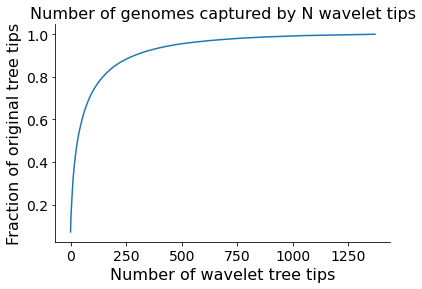

In [1120]:
# plot of number of total leaves in tree captured by X tips in the collapsed tree
fig, ax = plt.subplots(figsize=(6,4))
leaf_fractions = (n_leaves.sort_values(ascending=False).cumsum() / n_leaves.sum())
plt.plot(leaf_fractions.values)
ax.set_title('Number of genomes captured by N wavelet tips', fontsize=16)
ax.set_xlabel('Number of wavelet tree tips', fontsize=16)
ax.set_ylabel('Fraction of original tree tips', fontsize=16)
plt.tick_params(labelsize=14)
sns.despine()
plt.savefig('/data/mhoffert/fiererlab/periodic_phyla/figures/group_meeting_figures/n_genomes_captured.png', dpi=400, bbox_inches='tight')

In [737]:
len(leaf_fractions.loc[lambda x: x < 0.8])

146

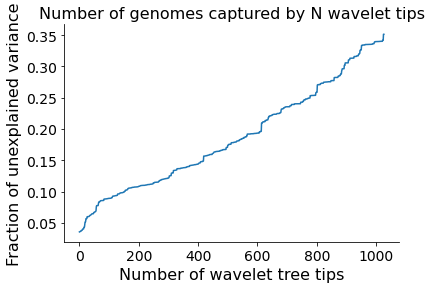

In [738]:
# plot of number of total leaves in tree captured by X tips in the collapsed tree
fig, ax = plt.subplots(figsize=(6,4))
unexp_var = varexp_ind_df.reindex(n_leaves.sort_values(ascending=False).index).dropna().sum(1).cumsum()
plt.plot(unexp_var.values)
ax.set_title('Number of genomes captured by N wavelet tips', fontsize=16)
ax.set_xlabel('Number of wavelet tree tips', fontsize=16)
ax.set_ylabel('Fraction of unexplained variance', fontsize=16)
plt.tick_params(labelsize=14)
sns.despine()

In [739]:
len(wavelet_tree.get_leaves())

1370

## Periodic table plot

In [742]:
import matplotlib as mpl

from sklearn.preprocessing import MinMaxScaler
from sklearn.manifold import TSNE

from adjustText import adjust_text

In [792]:
import mview

In [743]:
# find names for leaf nodes
new_leaf_names = pd.Series()
for node in wavelet_tree.get_leaves():
    n = node
    level = 1
    n = node.up
    while not '__' in names_map.loc[n.name]:
        n = n.up
        level += 1
    split = names_map.loc[n.name].split(':')[-1]
    tax = split.split('__')[0].upper()
    new_leaf_names.loc[node.name] = f'{tax}{level}:{split.split("__")[-1]}'
        

In [744]:
new_leaf_names.sort_index(ascending=False)

c124380                  G14:Mesorhizobium
c124238                  G12:Mesorhizobium
c124164                  G11:Mesorhizobium
c124086                  G10:Mesorhizobium
c123995                   G9:Mesorhizobium
                              ...         
GB_GCA_000961695_1           G3:Hyphomonas
GB_GCA_000830255_1    F1:Sulfurimonadaceae
GB_GCA_000299095_1         G7:Pelagibacter
GB_GCA_000209515_2           G1:Endobugula
GB_GCA_000153445_1             G7:HTCC2207
Length: 1370, dtype: object

In [745]:
carbon_binary = (pca_data[['3HP bicycle', 
                           #'3HP/4HB',
                           'Calvin Cycle',
       'rAcoA homoacetogenic', 'rTCA I', 
                           #'rTCA II'
                          ]].eq(1).sum(1) > 0).astype(int)

In [746]:
scaled_gr = pd.Series(data=MinMaxScaler().fit_transform(pca_data['growth_rate'].values.reshape(-1, 1)).reshape(1, -1)[0],
                      index=pca_data.index)

scaled_gc = pd.Series(data=MinMaxScaler().fit_transform(pca_data['gc_percentage'].values.reshape(-1, 1)).reshape(1, -1)[0],
                      index=pca_data.index)

scaled_gs = pd.Series(data=MinMaxScaler().fit_transform(pca_data['genome_size'].values.reshape(-1, 1)).reshape(1, -1)[0],
                      index=pca_data.index)

### TSNE for layout

In [748]:
get_leaf_names = lambda n: [l.name for l in gtdb_pruned.search_nodes(name=n.name)[0].get_leaves()]

In [749]:
tsne_input_data = []
for i, test_node in enumerate(wavelet_tree.get_leaves()):
    if i % 10 == 0:
        display(i)
        clear_output(wait=True)
    if test_node.name in n_leaves.sort_values(ascending=False).head(100).index:
        
# test_node = gtdb_pruned.search_nodes(name=wavelet_tree.get_leaves()[0].name)[0]
        test_leaves = get_leaf_names(test_node)
        tsne_input_data.append(pd.Series(data=[pca_data.loc[test_leaves, 'aerobe'].median(),
                                              pca_data.loc[test_leaves, 'phototroph'].eq(1).sum() / len(test_leaves),
                                              carbon_binary.loc[test_leaves].eq(1).sum() / len(test_leaves),
                                              scaled_gr.loc[test_leaves].median(),
                                              scaled_gc.loc[test_leaves].median(),
                                              scaled_gs.loc[test_leaves].median()],
                                         index=['aerobe', 
                                                'phototroph', 
                                                'carbon', 
                                                'growth rate', 
                                                'gc_content', 
                                                'genome_size',],
                                        name=test_node.name))

1360

In [750]:
tsne_input_data = pd.concat(tsne_input_data, axis=1).T

In [808]:
wavelet_distances = pd.DataFrame()
count = 0
for n1, n2 in itertools.combinations_with_replacement(tsne_input_data.index, 2):
    if count % 100 == 0:
        display(count)
        clear_output(wait=True)
    node1 = wavelet_tree&n1
    node2 = wavelet_tree&n2
    dist = wavelet_tree.get_distance(node1, node2)
    wavelet_distances.loc[n1, n2] = dist
    wavelet_distances.loc[n2, n1] = dist
    count += 1

5000

In [900]:
tsne_input_data.columns

Index(['aerobe', 'phototroph', 'carbon', 'growth rate', 'gc_content',
       'genome_size'],
      dtype='object')

***mview.mpse_tsne()***
  mview.MPSE():
(100, 100)
(100, 4)
    data details:
      number of perspectives : 2
      number of samples : 100
    visualization details:
      embedding dimension : 3
      image dimension : 2
      visualization type : tsne
  setup visualization instance for perspective 1 :
      mview.TSNE():
len 1
        data details:
          number of samples : 100
        embedding details:
          embedding dimension : 2
          perplexity : 25.00
        TSNE.initialize():
          method : random
          initial cost : 2.61e+00
  setup visualization instance for perspective 2 :
      mview.TSNE():
len 1
        data details:
          number of samples : 100
        embedding details:
          embedding dimension : 2
          perplexity : 25.00
        TSNE.initialize():
          method : random
          initial cost : 2.70e+00
    initialize:
      fixed embedding : False
      initial embedding : random
      fixed projections : False
      initial

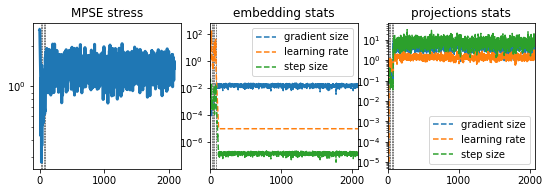

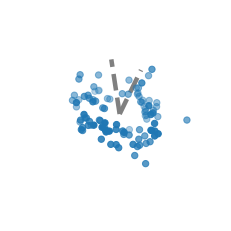

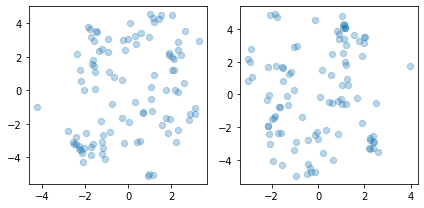

CPU times: user 24.9 s, sys: 1.28 s, total: 26.1 s
Wall time: 24.6 s


In [902]:
%%time
mv = mview.mpse_tsne(data=[wavelet_distances.values, tsne_input_data[['aerobe', 'phototroph', 'carbon', 'gc_content']].values],
                     perplexity=25,
                     iters=2000,
                     smart_init=True,
                      verbose=1,
                      show_plots=True)

In [903]:
mpse_tsne_embedding = pd.DataFrame(index=tsne_input_data.index, data=mv.embedding, columns=['dim1', 'dim2', 'dim3'])
mpse_tsne_embedding

,dim1,dim2,dim3
c000003,-0.006862,2.850567,1.096449
c001842,0.268639,3.789153,2.014354
c000835,1.791179,0.002180,-2.423719
c001546,1.471204,0.525730,-2.092951
c010369,-0.746530,4.193477,-0.070090
...,...,...,...
c023282,-1.027490,-0.773334,-0.657768
c006484,-1.153557,0.001526,0.143085
c003967,1.650901,-1.001034,-2.152697
c003897,0.615145,-0.729842,-1.494548


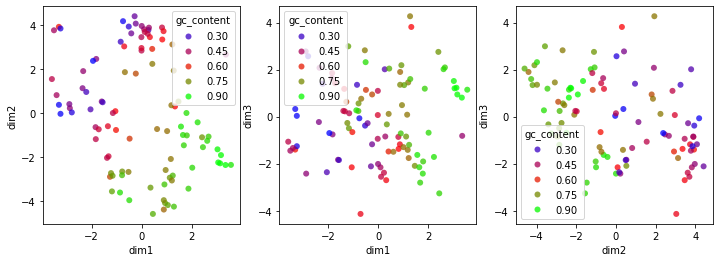

In [904]:
fig = plt.figure(figsize=(12, 4))
i = 1
for c1, c2 in itertools.combinations(mpse_tsne_embedding.columns, 2):
    ax = fig.add_subplot(1,3,i)
    
    
    sns.scatterplot(data=mpse_tsne_embedding, x=c1, y=c2, hue=tsne_input_data['gc_content'],
                   linewidth=0, alpha=0.75, palette='brg')
    
    
    i += 1

In [905]:
cmap = matplotlib.cm.gnuplot
postorder_hues = pd.Series(dict((l, cmap(c)) for l, c in zip([l.name for l in wavelet_tree.traverse(strategy='postorder') if l.name in tsne_input_data.index], np.linspace(0, 1, 100))))

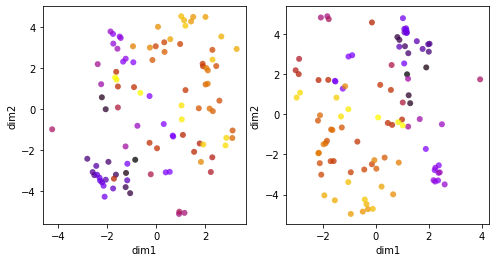

In [906]:
fig = plt.figure(figsize=(8,4))
for i in range(2):
    ax = fig.add_subplot(1,2,i+1)
    plotdf = pd.DataFrame(mv.images[i, :, :], columns=['dim1', 'dim2'], index=tsne_input_data.index)
    sns.scatterplot(data=plotdf, x='dim1', y='dim2', color=postorder_hues,
                   linewidth=0, alpha=0.75)

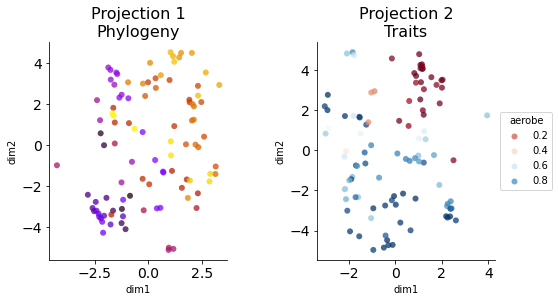

In [1123]:
fig = plt.figure(figsize=(8,4))
for i in range(2):
    ax = fig.add_subplot(1,2,i+1)
    if i == 1:
        trait = 'aerobe'
        cmap = 'RdBu'
        hues = tsne_input_data[trait]
    else:
        hues=postorder_hues
        cmap='gnuplot'
        
    plotdf = pd.DataFrame(mv.images[i, :, :], columns=['dim1', 'dim2'], index=tsne_input_data.index)
    sns.scatterplot(data=plotdf, x='dim1', y='dim2', hue=hues,
                   linewidth=0, alpha=0.75, palette=cmap)
    
    sns.despine()
    if i == 0:
        ax.get_legend().remove()
    else:
        lgd = ax.legend(loc='center left', bbox_to_anchor=(1, 0.5), title=trait)
    
    plt.tick_params(labelsize=14)

fig.axes[0].set_title('Projection 1\nPhylogeny', fontsize=16)
fig.axes[1].set_title('Projection 2\nTraits', fontsize=16)
fig.subplots_adjust(wspace=0.5)
plt.savefig('/data/mhoffert/fiererlab/periodic_phyla/figures/group_meeting_figures/enstsne_projection.png', dpi=400, bbox_inches='tight')


## Alternative approach: normal tSNE

In [764]:
%%time
tsne_embedding = TSNE(n_components=2, learning_rate='auto',
                  init='random', perplexity=3).fit_transform(tsne_input_data.values)

CPU times: user 12min 12s, sys: 116 ms, total: 12min 13s
Wall time: 24.3 s


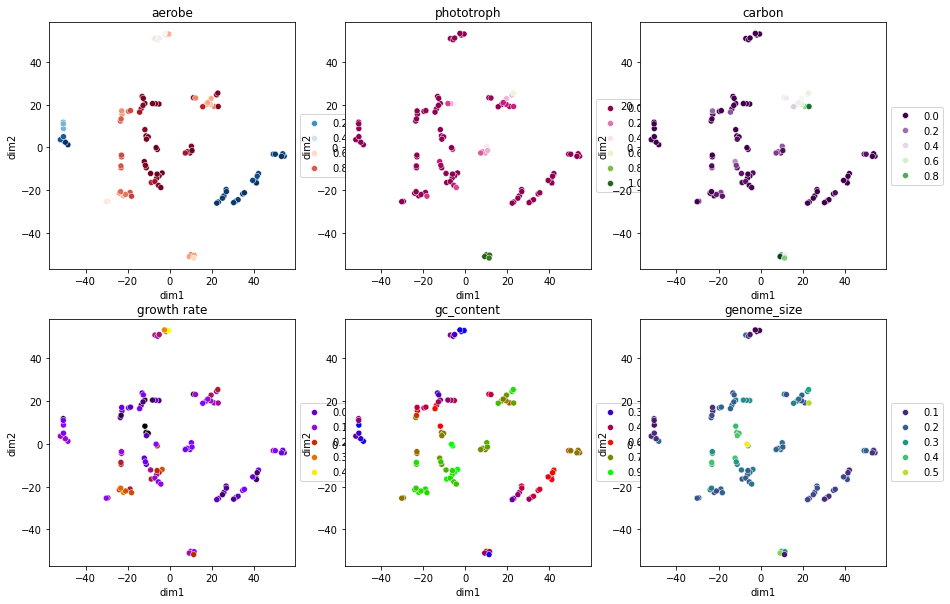

In [765]:
tsne_plotdf = pd.DataFrame(tsne_embedding, columns=['dim1', 'dim2'], index=tsne_input_data.index)
fig = plt.figure(figsize=(15, 10))
i = 1
for (trait, p) in zip(tsne_input_data.columns, 
                ['RdBu_r', 'PiYG', 'PRGn', 'gnuplot', 'brg', 'viridis']):
    ax = fig.add_subplot(2,3,i)
    ax.set_title(trait)
    sns.scatterplot(data=tsne_plotdf, x='dim1', y='dim2', hue=tsne_input_data[trait], palette=p)
    lgd = ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
    i += 1

In [753]:
# # no longer needed labeled version of the plot
# %%time
# fig, ax = plt.subplots(figsize=(12,12))
# trait = 'aerobe'
# sns.scatterplot(data=tsne_plotdf, x='dim1', y='dim2', hue=tsne_input_data[trait], palette='RdBu')
# texts = []
# for index, row in tsne_plotdf.iterrows():
#     texts.append(plt.text(s=index, x=row['dim1'], y=row['dim2']))
# adjust_text(texts, arrowprops={'arrowstyle':'->'})
# # plt.savefig(f'/data/mhoffert/fiererlab/periodic_phyla/figures/wavelet_tsne_{trait}.png', dpi=400)

### Snapping to grid

In [754]:
# from scipy.optimize import linear_sum_assignment

# def gridify(points, grid_size):
#     # Generate random points in x,y space
#     np.random.seed(143)  # for reproducibility

#     locations = np.array(list(itertools.product(range(grid_size), range(grid_size))))

#     # Define the distance function (squared Euclidean distance)
#     distance = lambda point, location: np.sum((point - location) ** 2)

#     # Initialize the cost matrix
#     cost_matrix = np.zeros((len(points), num_locations**2))

#     # Populate the cost matrix with distances
#     for i, point in enumerate(points):
#         for j, location in enumerate(locations):
#             cost_matrix[i, j] = distance(point, location)

#     # Solve the assignment problem to minimize the total distance
#     row_ind, col_ind = linear_sum_assignment(cost_matrix)

#     # Assign points to locations based on the optimal solution
#     assignments = locations[col_ind].reshape(-1, 2)
    
#     return assignments

In [911]:
tsne_plotdf = pd.DataFrame(mv.images[1, :, :], columns=['dim1', 'dim2'], index=tsne_input_data.index)

In [912]:
grid_spots = np.array(list(itertools.product(np.linspace(tsne_plotdf['dim1'].min(),
                             tsne_plotdf['dim1'].max(),
                             10),
                  np.linspace(tsne_plotdf['dim2'].min(),
                             tsne_plotdf['dim2'].max(),
                             10)))).reshape(10, 10, 2)

In [913]:
tsne_grid = gridify(tsne_plotdf.values, 10)

In [914]:
tsne_grid_df = pd.DataFrame(tsne_grid, index=tsne_plotdf.index, columns=['dim1', 'dim2'])

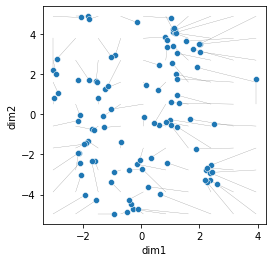

In [1124]:
# plot to visualizing snapping
fig, ax = plt.subplots(figsize=(4,4))
sns.scatterplot(data=tsne_plotdf, x='dim1', y='dim2')
for index, row in tsne_grid_df.iterrows():
    grid_x, grid_y = grid_spots[tsne_grid_df.loc[index, 'dim1']][tsne_grid_df.loc[index, 'dim2']]
    plt.plot((grid_x, tsne_plotdf.loc[index, 'dim1']),
             (grid_y, tsne_plotdf.loc[index, 'dim2']), color='gray', linewidth=0.25, zorder=0)
    # ax.annotate(index, (grid_x, grid_y))
# assignments
plt.savefig('/data/mhoffert/fiererlab/periodic_phyla/figures/group_meeting_figures/grid_assignments.png', dpi=400, bbox_inches='tight')


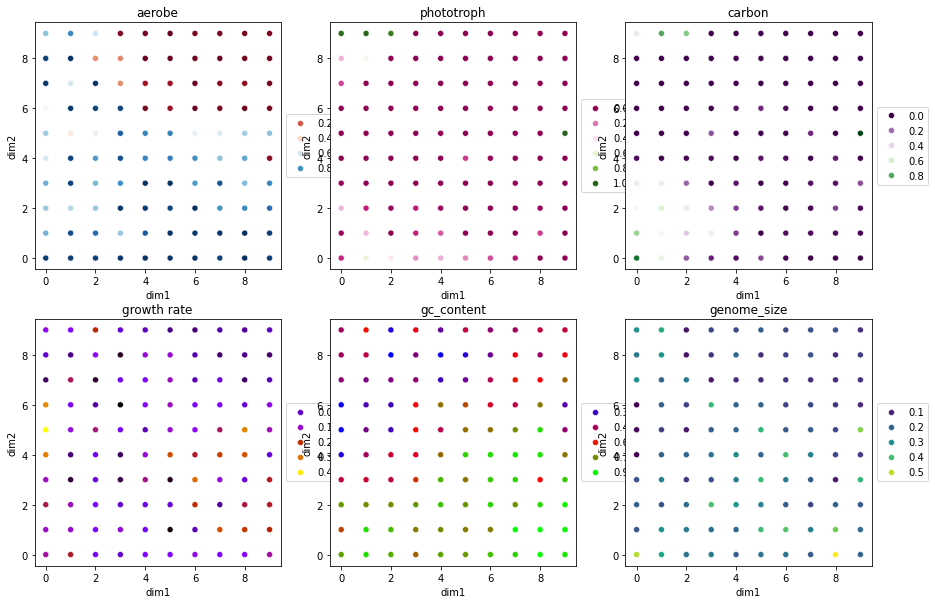

In [968]:
fig = plt.figure(figsize=(15, 10))
i = 1
for (trait, p) in zip(tsne_input_data.columns, 
                ['RdBu', 'PiYG', 'PRGn', 'gnuplot', 'brg', 'viridis']):
    ax = fig.add_subplot(2,3,i)
    # ax.set_ylim(10, -1)
    ax.set_title(trait)
    
    # total_unexp = []
    # for leaf in wavelet_tree.get_leaves():
    #     total_unexp.append(unexp_var_df.loc[leaf.name, 'aerobe'])
        
    
    sns.scatterplot(data=tsne_grid_df, x='dim1', y='dim2', hue=tsne_input_data[trait], palette=p)
    lgd = ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
    # for index, row in tsne_grid_df.iterrows():
    #     if 'Cyano' in new_leaf_names.loc[index]:
    #         ax.annotate(new_leaf_names.loc[index], (row['dim1'], row['dim2']))
    i += 1
plt.savefig('/data/mhoffert/fiererlab/periodic_phyla/figures/wavelet_period_table_placements.png', bbox_inches='tight', dpi=400)

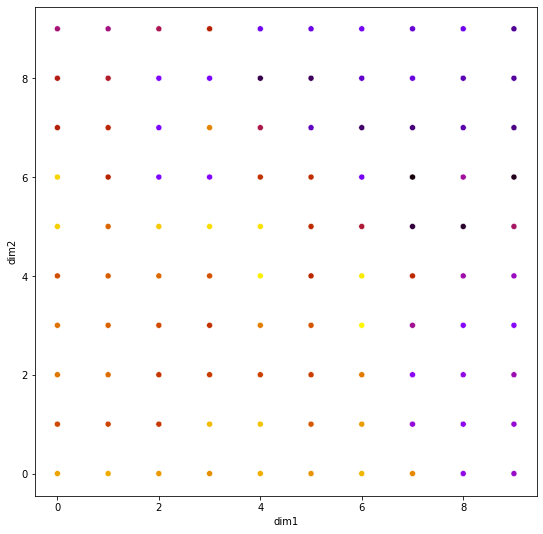

In [969]:
fig, ax = plt.subplots(figsize=(9,9))

sns.scatterplot(data=tsne_grid_df, x='dim1', y='dim2', hue=postorder_hues, palette='gnuplot')
# ax.set_ylim(10, -1)
# for index, row in tsne_grid_df.iterrows():
#     if 'Cyano' in new_leaf_names.loc[index]:
#         ax.annotate(new_leaf_names.loc[index], (row['dim1'], row['dim2']))
ax.get_legend().remove()
# adjust_text(texts)
plt.savefig('/data/mhoffert/fiererlab/periodic_phyla/figures/wavelet_period_table_postorder.png', dpi=400, bbox_inches='tight')


In [1110]:
## ------------------------------------------------
# OLD CODE
## ------------------------------------------------

# def calculate_hexagon_vertex(center_x, center_y, edge_length, vertex_number):
#     # Convert vertex number to radians
#     angle_rad = (vertex_number - 1) * (2 * np.pi / 6)
    
#     # Calculate vertex coordinates
#     vertex_x = center_x + edge_length * np.cos(angle_rad)
#     vertex_y = center_y + edge_length * np.sin(angle_rad)
    
#     return (vertex_x, vertex_y)

# fig, ax = plt.subplots(figsize=(4,4))
# plt.scatter(0,0)

# for i in range(6):
#     vert = calculate_hexagon_vertex(0, 0, 2, i)
#     if i == 1:
#         c='r'
#     else:
#         c='k'
#     plt.scatter(vert[0], vert[1], color=c)

# tsne_input_data.columns

# sns.palplot(mpl.colormaps[p](tsne_input_data.loc[index, trait]))

# fig, ax = plt.subplots(figsize=(10, 10))

# for count, (index, center) in enumerate(tsne_grid_df.iterrows()):
#     display(count)
#     clear_output(wait=True)
#     for trait, p, i in zip(tsne_input_data.columns, 
#                     ['RdBu', 'PiYG', 'PRGn', 'gnuplot', 'brg', 'viridis'],
#                     range(6)):
        
#         vert = calculate_hexagon_vertex(center['dim1'], center['dim2'], 0.25, i)
#         plt.scatter(x=vert[0], y=vert[1], color=mpl.colormaps[p](tsne_input_data.loc[index, trait]))
    

### DataFrame of all unexplained variances

In [771]:
unexp_var = []

for i, node in enumerate(list(gtdb_pruned.traverse(strategy='levelorder'))):
    if i % 100 == 0:
        display(i)
        clear_output(wait=True)
   
    nodes = [n.name for n in list(node.traverse())[1:] if not n.is_leaf()]
    unexp_var.append(varexp_ind_df.loc[nodes, :].sum(0).rename(node.name))
        

101400

In [772]:
unexp_var_df = pd.concat(unexp_var, axis=1).T

### Plotting table

In [919]:
def plot_01(data, ax, pos, color):
    _75, median, _25 = np.quantile(data, [0.75, 0.5, 0.25])
    _min, _max = data.min(), data.max()
    ax.plot([pos, pos], [_75, _25], color=color, linewidth=5)
    ax.scatter(x=[pos], y=[median], s=15, edgecolor='k', c='white', zorder=5)
    ax.plot([pos, pos], [_min, _max], color=color, linewidth=0.5)
    
    return ax

def plot_binary(data, ax, pos):
    
    frac_0 = data.eq(0).sum() / len(data)
    frac_1 = 1 - frac_0
    # ax.plot([pos-0.25, pos-0.25], [0, frac_0], color='k', linewidth=1, zorder=0)
    ax.scatter(x=[pos-0.25], y=[frac_1], s=25, edgecolor='k', c='white', zorder=5)
    
    return ax
    

In [920]:
unexp_var_df.head()

,aerobe,phototroph,3HP bicycle,3HP/4HB,Calvin Cycle,rAcoA homoacetogenic,rTCA I,rTCA II,growth_rate,genome_size,gc_percentage
c000000,0.996143,9.996994e-01,9.999808e-01,0.999991,9.995187e-01,0.999994,0.999996,9.999593e-01,0.999998,0.999556,0.998091
c000001,0.000636,3.673455e-04,0.000000e+00,0.000000,3.867522e-04,0.009999,0.000000,-3.330669e-16,0.002881,0.000795,0.002438
c000014,0.984257,9.987916e-01,9.999527e-01,0.999978,9.984474e-01,0.989963,0.999767,9.968516e-01,0.996991,0.992529,0.986149
c000003,0.000150,3.672856e-04,2.220446e-16,0.000000,-6.661338e-16,0.004895,0.000000,-2.220446e-16,0.002304,0.000657,0.002236
c000010,0.000054,-2.220446e-16,-2.220446e-16,0.000000,2.820114e-04,0.004823,0.000000,-1.110223e-16,0.000504,0.000113,0.000134


In [775]:
total_aerobe = []
for leaf in wavelet_tree.get_leaves():
    total_aerobe.append(unexp_var_df.loc[leaf.name, 'aerobe'])

In [778]:
# scaled medians for plotting
scaled_medians = pd.DataFrame(MinMaxScaler().fit_transform(tsne_input_data), columns=tsne_input_data.columns, index=tsne_input_data.index)

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.


In [779]:
scaled_medians

,aerobe,phototroph,carbon,growth rate,gc_content,genome_size
c000003,0.029093,0.006250,0.003172,0.244576,0.370457,0.214269
c001842,0.025517,0.000000,0.000000,0.321125,0.162142,0.119699
c000835,0.670582,0.000000,0.009400,0.799538,0.936892,0.217306
c001546,0.564297,0.014052,0.097474,0.441151,0.775375,0.299902
c010369,0.000000,0.000000,0.004093,0.346579,0.025589,0.337374
...,...,...,...,...,...,...
c023282,0.912300,0.000000,0.161135,0.223675,0.521132,0.304012
c006484,0.831414,0.008403,0.000000,0.127323,0.362696,0.328529
c003967,0.807997,0.019499,0.031105,0.469860,0.933184,0.699557
c003897,0.824724,0.004320,0.002193,0.340413,0.703999,0.490403


In [780]:
varexp_ind_df.loc[[i.name for i in wavelet_tree.get_leaves() if 'c' in i.name], :].sum()

aerobe                  0.034094
phototroph              0.027563
3HP bicycle             0.039606
3HP/4HB                 0.065291
Calvin Cycle            0.027071
rAcoA homoacetogenic    0.038546
rTCA I                  0.024861
rTCA II                 0.045103
growth_rate             0.017805
genome_size             0.020333
gc_percentage           0.011268
dtype: float64

In [781]:
len([i for i in get_leaf_names(wavelet_tree) if not 'c' in i])

50745

In [782]:
wavelet_tree.describe()

Number of leaf nodes:	1370
Total number of nodes:	2739
Rooted:	Yes
Most distant node:	RS_GCF_002105555_1
Max. distance:	2.091610


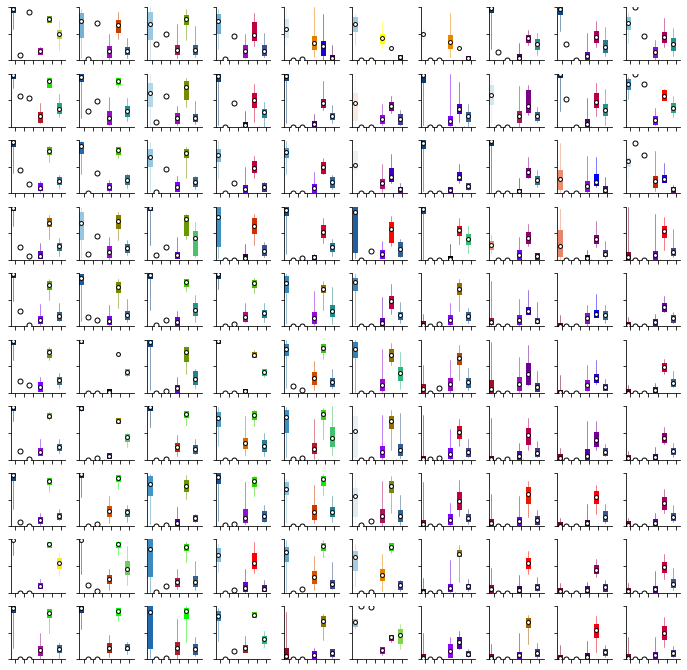

In [921]:
fig = plt.figure(figsize=(12, 12))
i = 1
for test_node, row in tsne_grid_df.sort_values(['dim1', 'dim2']).iterrows():
    
    display(i)
    clear_output(wait=True)
    
    test_node = gtdb_pruned.search_nodes(name=test_node)[0]
    test_leaves = get_leaf_names(test_node)

    ax = fig.add_subplot(10, 10, i)
    ax.set_xlim(-0.5,5.5)
    ax.set_ylim(0, 1)

    # ax.set_title(f'{test_node.name}\n{new_leaf_names.loc[test_node.name]}\nn={len(test_leaves)}')

    # aerobe
    color = mpl.colormaps['RdBu'](scaled_medians.loc[test_node.name, 'aerobe'])
    ax = plot_01(pca_data.loc[test_leaves, 'aerobe'], ax, -0.25, color)
    
    plt.plot((0.25, 0.25), (0, unexp_var_df.loc[test_node.name, 'aerobe']), 
             color='gray', linewidth=0.5)

    # phototroph
    ax = plot_binary(pca_data.loc[test_leaves, 'phototroph'], ax, 0.75)
    plt.plot((1.25, 1.25), (0, unexp_var_df.loc[test_node.name, 'phototroph']), 
             color='gray', linewidth=0.5)

    # carbon fixation
    ax = plot_binary(carbon_binary.loc[test_leaves], ax, 1.75)
    plt.plot((2.25, 2.25), (0, unexp_var_df.loc[test_node.name, ['3HP bicycle', 'Calvin Cycle', 'rAcoA homoacetogenic', 'rTCA I']].mean()), 
             color='gray', linewidth=0.5)

    # growth rate
    color = mpl.colormaps['gnuplot'](scaled_medians.loc[test_node.name, 'growth rate'])
    ax = plot_01(scaled_gr.loc[test_leaves], ax, 2.75, color)
    plt.plot((3.25, 3.25), (0, unexp_var_df.loc[test_node.name, 'growth_rate']), 
             color='gray', linewidth=0.5)

    # growth rate
    color = mpl.colormaps['brg'](scaled_medians.loc[test_node.name, 'gc_content'])
    ax = plot_01(scaled_gc.loc[test_leaves], ax, 3.75, color)
    plt.plot((4.25, 4.25), (0, unexp_var_df.loc[test_node.name, 'gc_percentage']), 
             color='gray', linewidth=0.5)

    # growth rate
    color = mpl.colormaps['viridis'](scaled_medians.loc[test_node.name, 'genome_size'])
    ax = plot_01(scaled_gs.loc[test_leaves], ax, 4.75, color)
    plt.plot((5.25, 5.25), (0, np.log10(unexp_var_df.loc[test_node.name, 'genome_size'])), 
             color='gray', linewidth=0.5)

    sns.despine()
    ax.set_xticks(range(6))
    # xticks = ax.set_xticklabels(['', 'aerobe', 'phototroph', 'carbon', 'growth rate', 'gc_content', 'genome_size', ''],
    #                    rotation=90)

    plt.tick_params(labelbottom=False, labelleft=False)

    # plt.savefig(f'/data/mhoffert/fiererlab/periodic_phyla/figures/wavelet_leaves/{test_node.name}_plot.png',
    #             bbox_inches='tight',
    #             dpi=400)
    # plt.show()
    # plt.cla()
    # plt.close()
    i += 1
fig.subplots_adjust(wspace=0.25, hspace=0.25)
plt.savefig('/data/mhoffert/fiererlab/periodic_phyla/figures/wavelet_periodic_table.png', dpi=400, bbox_inches='tight')

tsne_grid_df.sort_values(['dim1', 'dim2'], ascending=False)## drawing taxon-only periodic table

In [924]:
tsne_grid_df.sort_values(['dim1', 'dim2'], ascending=False)

,dim1,dim2
c042525,9,9
c042526,9,8
c029141,9,7
c001842,9,6
c014307,9,5
...,...,...
c023245,0,4
c041439,0,3
c038704,0,2
c033448,0,1


In [ ]:
def translate_coordinates(x, y):
    # Translate (x, y) coordinates from Grid B to Grid A labels
    # Grid A label is calculated by moving rows top to bottom and columns left to right
    return (9 - y) * 10 + (x + 1)

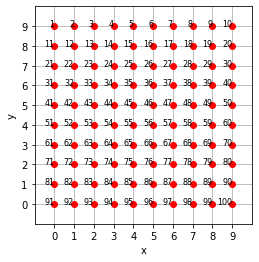

In [967]:
# Function to translate Grid A label to Grid B (x, y) coordinates
def translate_to_grid_B(label):
    label -= 1
    x = label % 10
    y = 9 - (label // 10)
    return x, y

# Create figure and axis
fig, ax = plt.subplots()

# Plot each point from Grid A to Grid B
for label in range(1, 101):
    x, y = translate_to_grid_B(label)
    ax.plot(x, y, 'ro')
    ax.text(x, y, str(label), fontsize=8, ha='right')

# Set grid, axis limits, and labels
ax.set_xticks(range(10))
ax.set_yticks(range(10))
ax.grid(True)
ax.set_xlim(-1, 10)
ax.set_ylim(-1, 10)
ax.set_xlabel('x')
ax.set_ylabel('y')
ax.set_aspect('equal')

plt.show()


In [1014]:
# better leaf names
# find names for leaf nodes
new_leaf_names_2 = pd.Series()

for i, node in enumerate(wavelet_tree.get_leaves()):
    display(i)
    clear_output(wait=True)
    
    # n = gtdb_pruned.search_nodes(name=node.name)[0]
    n = gtdb_full.search_nodes(name=node.name)[0]

    level = 0
    while not '__' in names_map.loc[n.name]:
        n = n.up
        level += 1
    
    split = names_map.loc[n.name].split(':')[-1]
    tax = split.split('__')[0].upper()
    new_leaf_names_2.loc[node.name] = f'{tax}{level}:{split.split("__")[-1]}'
    
    if f'{tax}{level}:{split.split("__")[-1]}' != new_leaf_names.loc[node.name]:
        print(f'{tax}{level}:{split.split("__")[-1]}', new_leaf_names.loc[node.name])

1369

In [1025]:
new_leaf_names_2.loc[tsne_grid_df.index[(new_leaf_names_2.loc[tsne_grid_df.index] != new_leaf_names.loc[tsne_grid_df.index])]]

c001526               D14:Bacteria
c000201                D8:Bacteria
c009808      P1:Desulfovibrionales
c038696    C12:Gammaproteobacteria
c016047     C3:Alphaproteobacteria
c023282     C6:Alphaproteobacteria
dtype: object

In [1031]:
node = gtdb_full.search_nodes(name='c000201')[0]
for n in node.traverse(strategy='levelorder'):
    if 'p__' in names_map.loc[n.name]:
        print(names_map.loc[n.name])

100.0:p__Verrucomicrobiota
100.0:p__Ratteibacteria; c__UBA8468
96.0:p__Omnitrophota
100.0:p__JABMQX01; c__JABMQX01; o__JABMQX01
100.0:p__Aureabacteria; c__SURF-26; o__SURF-26; f__SURF-26
100.0:p__UBA3054; c__UBA3054; o__UBA3054
100.0:p__Chlamydiota; c__Chlamydiia
100.0:p__PUNC01; c__PUNC01; o__PUNC01
100.0:p__JACPWU01; c__JACPWU01; o__JACPWU01; f__JACPWU01
100.0:p__JAFGBW01; c__JAFGBW01
100.0:p__NPL-UPA2; c__NPL-UPA2; o__NPL-UPA2
100.0:p__CAIJMQ01; c__CAIJMQ01
100.0:p__UBA6266; c__UBA6266; o__UBA6266; f__UBA6266; g__UBA6266


In [1033]:
labeled_subnodes = pd.DataFrame(columns=['node', 'subnode', 'leaf_count'])
indexer = 0
for i, wavelet_leaf in enumerate(tsne_grid_df.index):
    display(i)
    clear_output(wait=True)
    node = gtdb_pruned.search_nodes(name=wavelet_leaf)[0]
    for n in node.traverse(strategy='levelorder'):
        if '__' in names_map.loc[n.name]:
            labeled_subnodes.loc[indexer, 'node'] = node.name
            labeled_subnodes.loc[indexer, 'subnode'] = n.name
            labeled_subnodes.loc[indexer, 'leaf_count'] = len(n.get_leaves())
            
            indexer += 1
            
labeled_subnodes.head()

,node,subnode,leaf_count
0,c000003,c000034,4
1,c000003,c000094,308
2,c000003,c000096,2
3,c000003,c000209,26
4,c000003,c000311,15


In [1054]:
len(labeled_subnodes.index)

4498

In [1042]:
top_subnodes = labeled_subnodes.groupby('node').apply(lambda x: names_map.loc[x.sort_values('leaf_count', ascending=False)['subnode'].iloc[:5]].values)

In [1043]:
top_subnodes

node
c000003    [100.0:c__Spirochaetia, 100.0:o__Treponematale...
c000201    [100.0:p__Verrucomicrobiota, 100.0:c__Verrucom...
c000410    [100.0:c__Vampirovibrionia, 100.0:o__Gastranae...
c000420    [100.0:o__Deinococcales, 100.0:f__Deinococcace...
c000422    [100.0:c__Coriobacteriia, 100.0:o__Coriobacter...
                                 ...                        
c117144    [100.0:g__Tabrizicola, 100.0:g__Gemmobacter, 1...
c118716                                  [68.0:g__Rhizobium]
c118745       [91.0:g__Bradyrhizobium, 100.0:g__Nitrobacter]
c119085    [100.0:g__Ruegeria, 100.0:g__Sulfitobacter, 10...
c119534    [99.0:g__Roseovarius, 100.0:g__Pseudooceanicol...
Length: 95, dtype: object

In [1049]:
labels = top_subnodes.apply(lambda x: '\n'.join(['_'.join(s.split(':')[-1].split('__')[-2:]) for s in x]))

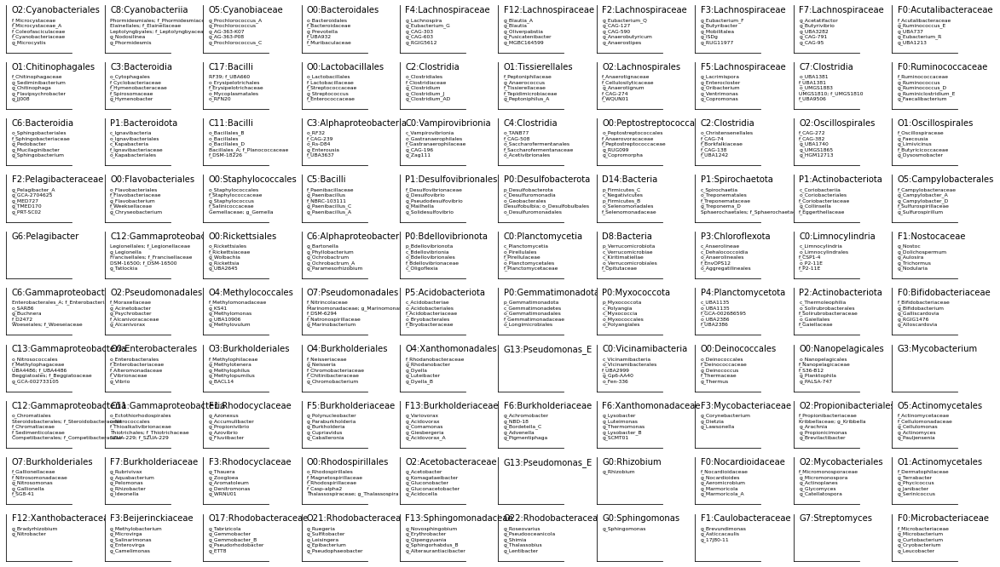

In [1061]:
fig = plt.figure(figsize=(20, 12))
i = 1
for test_node, row in tsne_grid_df.iterrows():
    newind = translate_coordinates(row['dim1'], row['dim2'])
    ax = fig.add_subplot(10, 10, newind)
    ax.set_xlim(-0.5,5.5)
    ax.set_ylim(0, 1)
    
    # for sp in ['right', 'left', 'top', 'bottom']:
    #     ax.spines[sp].set_visible(False)
    ax.annotate(new_leaf_names_2.loc[test_node], (0, 1), annotation_clip=False, va='top')
    # if newind == 1:
    if test_node in labels.index:
        ax.annotate(labels.loc[test_node], (0, 0.75), annotation_clip=False, fontsize=6, va='top')
    plt.tick_params(left=False, labelleft=False, bottom=False, labelbottom=False)
    sns.despine()
    i += 1

fig.subplots_adjust(wspace=0.5)

plt.savefig('/data/mhoffert/fiererlab/periodic_phyla/figures/wavelet_periodic_table_labels.svg', bbox_inches='tight')
plt.show()


In [953]:
tsne_grid_df.sort_values(['dim1', 'dim2'], ascending=[True, False]).rename(index=new_leaf_names)

,dim1,dim2
O2:Cyanobacteriales,0,9
O1:Chitinophagales,0,8
C6:Bacteroidia,0,7
F2:Pelagibacteraceae,0,6
G6:Pelagibacter,0,5
...,...,...
O6:Actinomycetales,9,4
G3:Mycobacterium,9,3
O5:Actinomycetales,9,2
O1:Actinomycetales,9,1


c000003                 P1:Spirochaetota
c000149                       F1:UBA5550
c000219                       F2:UBA5550
GB_GCA_002839375_1            F2:UBA5550
c000152                       C3:UBA4802
                             ...        
c003897               P5:Acidobacteriota
c003898               P5:Acidobacteriota
c002284               P3:Acidobacteriota
c001712               P2:Acidobacteriota
c000869                      D4:Bacteria
Length: 1370, dtype: object

## Drawing of additional tree

In [156]:
%%time
# make a second tree to draw the wavelets / traits on
drawn_tree = collapseTree(gtdb_pruned, collapse_count, n=50, keep_nodes=set(wavelet_node_data.index))
drawn_tree.describe()

Number of leaf nodes:	3814
Total number of nodes:	7627
Rooted:	Yes
Most distant node:	c071321
Max. distance:	2.266660
CPU times: user 4.14 s, sys: 66.2 ms, total: 4.21 s
Wall time: 4.2 s


In [157]:
# verify all tips in wavelet tree are leaves / internal nodes in drawn tree
%time drawn_nodes = set([n.name for n in drawn_tree.traverse()])
n_leaves = len(wavelet_tree.get_leaves())
not_found = []
for i, n in enumerate(wavelet_tree.get_leaves()):
    
    if i % 10 == 0:
        display(f'Not found: {len(not_found)} {i / n_leaves * 100:.2f} %')
        clear_output(wait=True)
        
    if not n.name in drawn_nodes:
        not_found.append(n.name)
        


'Not found: 0 99.62 %'

In [137]:
# trait = 'phototroph'
# level = 10
# clades = internal_nodes.loc[trait, level]

In [139]:
# collapsed = collapseTree(gtdb_pruned, collapse_to_phylum, clades=clades)

# collapsed.describe()

In [158]:
%%time
n_leaves = len(wavelet_tree.get_leaves())
internal_node_colors = {}
# for each leaf in collapsed tree, assign a color
for i, (cl, color) in enumerate(zip(wavelet_tree.get_leaves(), sns.color_palette('tab20', n_leaves))):
    
    if i % 10 == 0:
        display(f'{i / n_leaves * 100:.2f} %')
        clear_output(wait=True)
    
    # in all subnodes, assign that color as well    
    for node in gtdb_pruned.search_nodes(name=cl.name)[0].traverse():
         internal_node_colors[node.name] = to_hex(color)

CPU times: user 4min 44s, sys: 2.94 s, total: 4min 46s
Wall time: 4min 46s


In [164]:
%%time
# this code makes colors mapped to the average over the leaves for each tip in the wavelet tree
# set cmap
cmap = plt.get_cmap('PiYG')

# helper function to get number of leaves for a node
get_leaf_names = lambda n: [l.name for l in gtdb_pruned.search_nodes(name=n.name)[0].get_leaves()]

# make dict mapping each wavelet clade to its mean trait value
clade2mean = {}
n_leaves = len(wavelet_tree.get_leaves())
for i, cl in enumerate(wavelet_tree.get_leaves()):
    if i % 10 == 0:
        display(f'Part 1: {i / n_leaves * 100:.2f} %')
        clear_output(wait=True)
    
    # map same mean val to ALL subclades
    mean_val = np_pca_data.loc[get_leaf_names(cl), trait].mean()
    for node in gtdb_pruned.search_nodes(name=cl.name)[0].traverse():
        clade2mean[node.name] = mean_val

CPU times: user 9min 20s, sys: 5.56 s, total: 9min 26s
Wall time: 9min 26s


#### Note
`clade2mean` does not have mean for each clade: it has the same value (the mean of the wavelet clade) for all subclades of each wavelet!! 

In [165]:
%%time
# colormap mapping each tip in the drawn tree (collapsed_count) to the mean for it's parent wavelet
mean_ring_colors = {}
n_leaves = len(drawn_tree.get_leaves())

for i, cl in enumerate(drawn_tree.get_leaves()):
    
    if i % 10 == 0:
        display(f'Part 2: {i / n_leaves * 100:.2f} %')
        clear_output(wait=True)
    
    for node in gtdb_pruned.search_nodes(name=cl.name)[0].traverse():
        mean_ring_colors[node.name] = to_hex(cmap(clade2mean[cl.name]))

CPU times: user 8min 30s, sys: 5.18 s, total: 8min 35s
Wall time: 8min 35s


In [166]:
%%time
ring_colors = dict([(cl.name, to_hex(cmap(np_pca_data.loc[get_leaf_names(cl), trait].mean()))) for cl in drawn_tree.get_leaves()])


CPU times: user 8min 27s, sys: 5.04 s, total: 8min 32s
Wall time: 8min 32s


In [172]:
def layout_collapsed_phylum(node, clades, inc, mrc, rc):
    '''
    Layout function for tree generated by collapse_to_phylum
    '''
    # print(node.name)
    internal_ns = NodeStyle()
    internal_ns['size'] = 0
    # if node.name in clades:
    #     # print('yes')
    #     internal_ns['size'] = 10
    #     internal_ns['fgcolor'] = 'red'
    # else:
        
        
    if node.name in inc.keys():
        internal_ns['vt_line_color'] = inc[node.name]
        internal_ns['hz_line_color'] = inc[node.name]
    
    fixed_height = 1
    
    if node.is_leaf():
        
        ringcolor = inc[node.name]
        
        # first ring: wavelet membership
        R1 = RectFace(width=4, height=fixed_height, fgcolor=ringcolor, bgcolor=ringcolor)
        faces.add_face_to_node(R1, node, 0, position='aligned')
        
        # white ring
        Rs = RectFace(width=2, height=fixed_height, fgcolor='white', bgcolor='white')
        faces.add_face_to_node(Rs, node, 1, position='aligned')
        
        # ------------------------------------------------------------------------
        # second ring: mean across wavelet group
        ringcolor = mrc[node.name]
        
        R1 = RectFace(width=12, height=fixed_height, fgcolor=ringcolor, bgcolor=ringcolor)
        faces.add_face_to_node(R1, node, 2, position='aligned')
        
        Rs = RectFace(width=2, height=fixed_height, fgcolor='white', bgcolor='white')
        faces.add_face_to_node(Rs, node, 3, position='aligned')
        
        # ------------------------------------------------------------------------
        # third ring: mean across collapsed clade in tip of drawn tree
        ringcolor = rc[node.name]
        
        R2 = RectFace(width=12, height=fixed_height, fgcolor=ringcolor, bgcolor=ringcolor)
        faces.add_face_to_node(R2, node, 4, position='aligned')
        
        Rs = RectFace(width=2, height=fixed_height, fgcolor='white', bgcolor='white')
        faces.add_face_to_node(Rs, node, 5, position='aligned')

    # set node style
    node.img_style = internal_ns

def phylum_collapse_ts(**args):
    ts = TreeStyle()
    ts.mode = 'c'
    ts.layout_fn = lambda n: layout_collapsed_phylum(n, **args)
    # ts.scale = 400
    ts.show_leaf_name = False
    ts.draw_guiding_lines = False
    
    return ts

CPU times: user 8.29 s, sys: 324 ms, total: 8.62 s
Wall time: 8.61 s


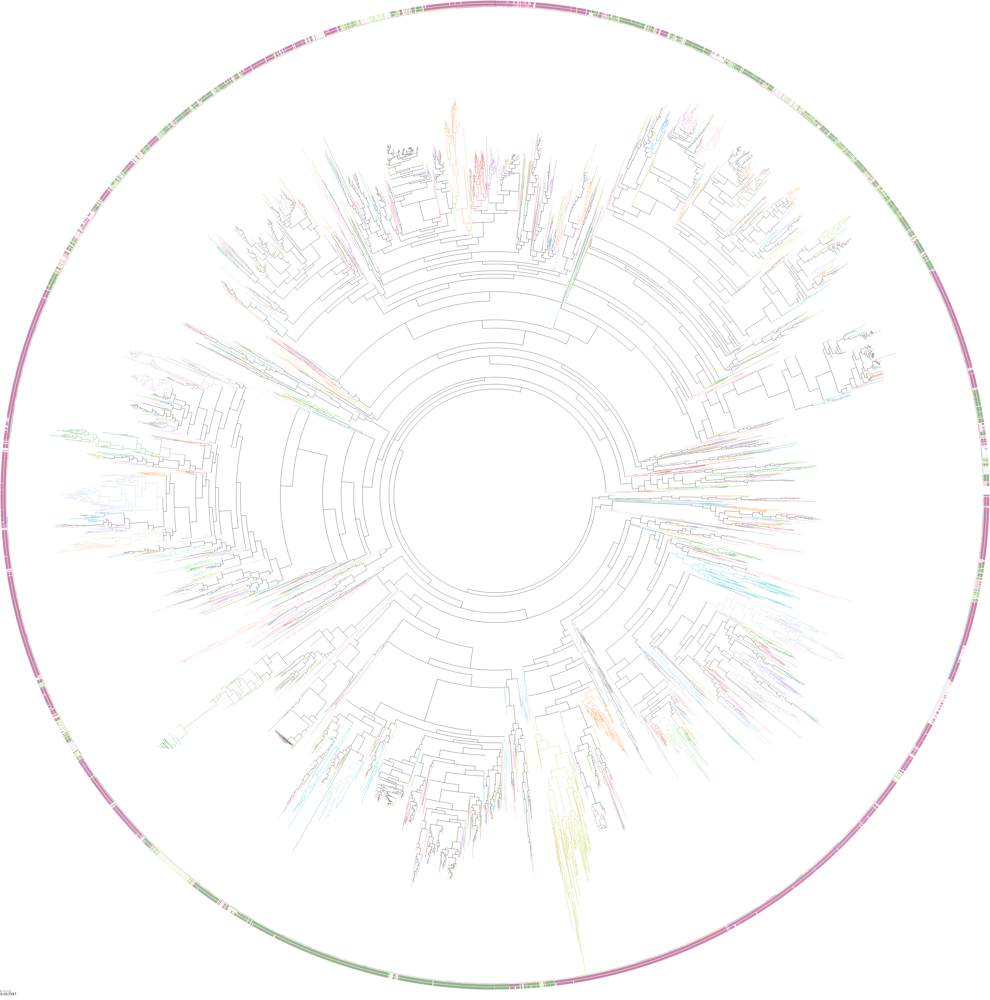

In [173]:
%%time
drawn_tree.render('%%inline', tree_style=phylum_collapse_ts(clades=set(wavelet_node_data.index), 
                                                                 inc=internal_node_colors, 
                                                                 mrc=mean_ring_colors,
                                                                 rc=ring_colors))